In [1]:
import pandas as pd
import numpy as np
import scipy
import matplotlib.pyplot as plt
import seaborn
import os
import dask.dataframe as dd
import sys
import math
import multiprocessing
import time

sys.path.append(os.path.join(os.path.dirname(
    os.path.abspath(''))))
import common.plots as plots

In [2]:
df = pd.DataFrame({'A': [1, 2, 3, 4], 'B': [5, 6, 7, 8]})
print(np.sqrt(df['A']).mean())

1.5365660924854931


In [3]:
def gaussian_2d(x, y, sigma_x, sigma_y):
    return 1/math.sqrt(2 * math.pi * (sigma_x ** 2 + sigma_y ** 2)) * np.exp(-x ** 2/(2 * sigma_x ** 2) - y ** 2/(2 * sigma_y ** 2))

def get_data_array(sigma_x, sigma_y, L):
    x = np.empty(0, dtype=int)
    y = np.empty(0, dtype=int)
    for i in range(-L, L + 1):
        x = np.append(x, np.full(2 * L + 1, i, dtype=int))
        y = np.append(y, np.linspace(-L, L, num=2*L+1, dtype=int))
    return x, y, gaussian_2d(x, y, sigma_x, sigma_y)


In [4]:
def heatmap_ax(ax, df):
    df = df.pivot(columns='x', index='y', values='f')
    seaborn.heatmap(df, ax=ax, square=True, annot=False)

def heatmap_ax_wrapping(args):
    heatmap_ax(*args)

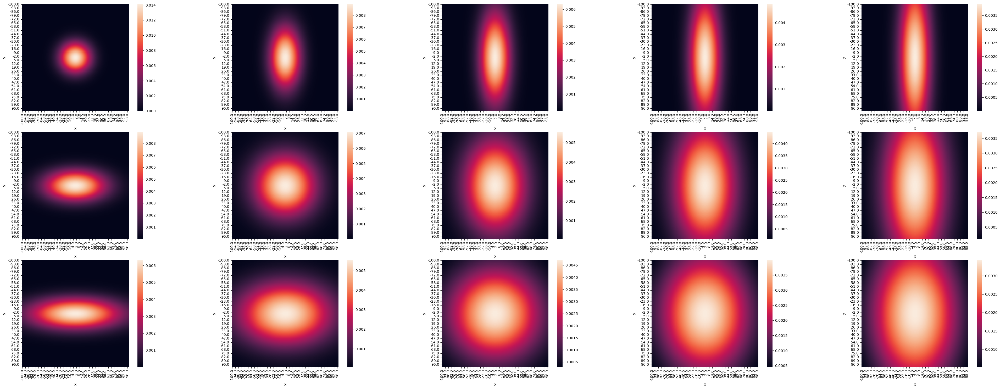

In [5]:
n = 3
m = 5
L = 100
x = np.empty(0)
y = np.empty(0)
f = np.empty(0)
sigma_x_arr = np.empty(0)
sigma_y_arr = np.empty(0)
for i in range(n):
    for j in range(m):
        sigma_x = (i + 1) * L / 5
        sigma_y = (j + 1) * L / 5
        x_tmp, y_tmp, f_tmp = get_data_array((i + 1) * L / 5, (j + 1) * L / 5, L)
        x = np.append(x, x_tmp)
        y = np.append(y, y_tmp)
        f = np.append(f, f_tmp)
        sigma_x_arr = np.append(sigma_x_arr, np.full((2 * L + 1) ** 2, sigma_x, dtype=int))
        sigma_y_arr = np.append(sigma_y_arr, np.full((2 * L + 1) ** 2, sigma_y, dtype=int))
df = pd.DataFrame({'x': x, 'y': y, 'f': f, 'sigma_x': sigma_x_arr, 'sigma_y': sigma_y_arr})
fig, ax = plt.subplots(nrows=n, ncols=m)
fig.set_size_inches(50, 18)
sigma_x_arr = np.sort(df['sigma_x'].unique())
sigma_y_arr = np.sort(df['sigma_y'].unique())

args = []
for i in range(len(sigma_x_arr)):
    for j in range(len(sigma_y_arr)):
        args.append([ax[i, j], df[(df['sigma_x'] == sigma_x_arr[i]) & (df['sigma_y'] == sigma_y_arr[j])][['x', 'y', 'f']]])

pool = multiprocessing.Pool(i * j)
pool.map(heatmap_ax_wrapping, args)

for i in range(len(sigma_x_arr)):
    for j in range(len(sigma_y_arr)):
        df_tmp = df[(df['sigma_x'] == sigma_x_arr[i]) & (df['sigma_y'] == sigma_y_arr[j])][['x', 'y', 'f']]
        df_tmp = df_tmp.pivot(columns='x', index='y', values='f')
        seaborn.heatmap(df_tmp, ax=ax[i, j], square=True, annot=False)

In [6]:
df1 = pd.DataFrame({'A': [1, 2, 3], 'B': ['a', 'b', 'b'], 'C': [7, 1, 6]})
df2 = pd.DataFrame({'A': [2, 3, 4], 'B': ['b', 'b', 'c'], 'C': [2, 3, 9]})
print(df1)
print(df2)
df3 = pd.concat([df1[['A', 'B']], df2[['A', 'B']]])
print(df3)
df3 = df3[df3.duplicated(subset=['A', 'B'], keep='first')]
print(df3)
df1 = df3.merge(df1, how='left', on=['A', 'B'])
df2 = df3.merge(df2, how='left', on=['A', 'B'])
print(df1)
print(df2)

   A  B  C
0  1  a  7
1  2  b  1
2  3  b  6
   A  B  C
0  2  b  2
1  3  b  3
2  4  c  9
   A  B
0  1  a
1  2  b
2  3  b
0  2  b
1  3  b
2  4  c
   A  B
0  2  b
1  3  b
   A  B  C
0  2  b  1
1  3  b  6
   A  B  C
0  2  b  2
1  3  b  3


In [7]:
def get_dir_names(path):
    directories = []
    for (dirpath, dirnames, filenames) in os.walk(path):
        directories.extend(dirnames)
        break
    return directories

def read_data(path, observable):
    df = pd.DataFrame()
    velocity_dirs = get_dir_names(path)
    for velocity in velocity_dirs:
        beta_dirs = get_dir_names(f'{path}/{velocity}')
        for beta in beta_dirs:
            df_tmp = pd.read_csv(f'{path}/{velocity}/{beta}/observables_distribution_aver.csv', delimiter=' ')
            df_tmp = df_tmp[['x', 'y', observable, f'{observable}_err']]
            df_tmp['velocity'] = velocity
            df_tmp['beta'] = float(beta)
            df = pd.concat([df, df_tmp])
    return df

In [8]:
a = np.array([1, 2, 3, 4])
a = np.reshape(a, (2, 2))
print(a)

[[1 2]
 [3 4]]


In [9]:
def gaussian_smearing(df, observable):
    data = []
    for x in df['x'].unique():
        data.append(df[df['x'] == x][observable].to_numpy())
    data = np.array(data)
    data = scipy.ndimage.gaussian_filter(data, sigma=1)
    df = pd.DataFrame()
    for x in range(len(data)):
        df = pd.concat([df, pd.DataFrame({'x': [x - len(data) // 2] * len(data), 'y': list(range(-(len(data) // 2), len(data) // 2 + 1)), observable: data[x]})])
    return df

In [10]:
def make_heatmap1(path, observable):
    df = pd.read_csv(path, delimiter=' ')
    print(df)
    df = df[['x', 'y', observable]]
    df = df.pivot(columns='x', index='y', values=observable)
    seaborn.heatmap(df, square=True)
    plt.show()

def make_heatmap1(path_0, path_T, observable):
    df_0 = pd.read_csv(path_0, delimiter=' ')
    df_T = pd.read_csv(path_T, delimiter=' ')
    df_0 = df_0[['x', 'y', observable]]
    df_T = df_T[['x', 'y', observable]]
    df_T[observable] = df_T[observable] - df_0[observable]
    df_T = df_T.pivot(columns='x', index='y', values=observable)
    seaborn.heatmap(df_T, square=True)
    plt.show()


def make_heatmap(path):
    df = pd.read_csv(path, delimiter=' ', header=None, names=['x', 'y', 'J', 'err'])
    print(df)
    df = df.drop('err', axis=1)
    df = df.pivot(columns='x', index='y', values='J')
    seaborn.heatmap(df, square=True)
    plt.show()

def make_heatmap(path_0, path_T):
    df_0 = pd.read_csv(path_0, delimiter=' ', header=None, names=['x', 'y', 'J', 'err'])
    df_T = pd.read_csv(path_T, delimiter=' ', header=None, names=['x', 'y', 'J', 'err'])
    df_T['J'] = df_T['J'] - df_0['J']
    df_T = df_T.drop('err', axis=1)
    df_T = df_T.pivot(columns='x', index='y', values='J')
    seaborn.heatmap(df_T, square=True)
    plt.show()

def plot_heatmap(df, observable, vmin, vmax):
    print(df.name[0], df.name[1])
    df = gaussian_smearing(df, observable)
    print(df)
    df = df.pivot(columns='x', index='y', values=observable)
    seaborn.heatmap(df, square=True, vmin=vmin, vmax=vmax)
    plt.show()

def heatmap_grid(*args, **kwargs):
    # print(args)
    # print(kwargs)
    df = gaussian_smearing(kwargs['data'], kwargs['observable'])
    df = df.pivot(columns='x', index='y', values=kwargs['observable'])
    # fig, axs = plt.subplots(2, 1, layout='constrained')
    # seaborn.heatmap(df, square=True, vmin=kwargs['vmin'], vmax=kwargs['vmax'], ax=axs[0])
    aspect = 0.5
    fig = plt.gcf()
    ax = fig.gca()
    seaborn.heatmap(df, square=True, vmin=kwargs['vmin'], vmax=kwargs['vmax'], ax=ax)
    bbox = ax.get_position()
    # ax1 = fig.add_subplot(3, 10, 1)
    ax1 = fig.add_axes([bbox.x0, bbox.y0 - bbox.height / 3, bbox.width, bbox.height / 3])
    print([bbox.x0, bbox.y0 - bbox.height / 3, bbox.width, bbox.height / 3])
    bbox1 = ax1.get_position()
    # ax1.set_position([bbox1.x0, bbox1.y0, bbox1.width, 0.2917940329218105])
    bbox1 = ax1.get_position()
    print('bbox1', bbox1)
    ax1.plot([1, 60, 120], [0, 120, 60])
    ax.set_position([bbox.x0, bbox.y0, bbox.width * 0.3, bbox.height * 0.3])
    bbox = ax.get_position()
    print('bbox', bbox)
    # ax.set_aspect(aspect)
    # ax1 = fig.add_subplot(211)
    # seaborn.heatmap(df, square=True, vmin=kwargs['vmin'], vmax=kwargs['vmax'], ax=ax1)

def heatmap_errorbar(df, subplot_ratio, observable, image_path, image_name):
    start = time.time()
    betas = np.sort(df['beta'].unique())
    velocities = np.sort(df['velocity'].unique())
    vmax = max(abs(df[observable].max()), abs(df[observable].min()))
    vmin = -vmax
    gs_kw = dict(height_ratios=list([subplot_ratio if i % 2 == 0 else 1 for i in range(len(velocities) * 2)]))
    fig, ax = plt.subplots(nrows=len(velocities) * 2, ncols=len(betas), gridspec_kw=gs_kw)
    fig.set_size_inches(50, 18)
    fig.suptitle(observable, fontsize=16)
    df['x'] = df['x'] - df['x'].max()//2
    df['y'] = df['y'] - df['y'].max()//2
    df['rad'] = np.sqrt(df['x'] ** 2 + df['y'] ** 2)
    end = time.time()
    print("preparation time = %s" % (end - start))
    for i in range(len(velocities)):
        for j in range(len(betas)):
            print(betas[j])
            print(velocities[i])
            start = time.time()
            df_tmp = df[(df['beta'] == betas[j]) & (df['velocity'] == velocities[i])]
            # df1 = df_tmp.loc[(df_tmp['y'] == 0) | (df_tmp['y'] == df_tmp['x'])]
            df1 = df_tmp.loc[(df_tmp['y'] == 0)]
            df_tmp = df_tmp.loc[:, ['x', 'y', observable]]
            end = time.time()
            print("time1 = %s" % (end - start))
            start = time.time()
            df_tmp = gaussian_smearing(df_tmp, observable)
            end = time.time()
            print("gauss time = %s" % (end - start))
            start = time.time()
            df_tmp = df_tmp.pivot(columns='x', index='y', values=observable)
            seaborn.heatmap(df_tmp, ax=ax[i * 2, j], vmin=vmin, vmax=vmax, square=True, annot=False, cmap='RdBu')
            ax[i * 2 + 1, j].errorbar(df1['x'], df1[observable], df1[f'{observable}_err'], ls='none', capsize=1, fmt='o', ms=1)
            ax[i * 2, j].set_title(f'beta = {betas[j]} | velocity = {velocities[i]}')
            end = time.time()
            print("plot time = %s" % (end - start))
    plots.save_image_plt(image_path, image_name, dpi=400)
    plt.show()

preparation time = 0.404829740524292
3.76
0.000000v
time1 = 0.018404006958007812
gauss time = 0.06525206565856934
plot time = 1.0465335845947266
3.84
0.000000v
time1 = 0.017664194107055664
gauss time = 0.06193256378173828
plot time = 0.7204091548919678
3.92
0.000000v
time1 = 0.017601728439331055
gauss time = 0.0622248649597168
plot time = 0.8701958656311035
3.96
0.000000v
time1 = 0.018090248107910156
gauss time = 0.0622713565826416
plot time = 0.9171781539916992
3.98
0.000000v
time1 = 0.01811671257019043
gauss time = 0.061954498291015625
plot time = 1.4212214946746826
4.0
0.000000v
time1 = 0.01844620704650879
gauss time = 0.061351776123046875
plot time = 0.868908166885376
4.24
0.000000v
time1 = 0.018828868865966797
gauss time = 0.06297707557678223
plot time = 0.921605110168457
4.68
0.000000v
time1 = 0.01741814613342285
gauss time = 0.06334137916564941
plot time = 0.9269883632659912
5.08
0.000000v
time1 = 0.01737356185913086
gauss time = 0.06347060203552246
plot time = 0.966260671615600

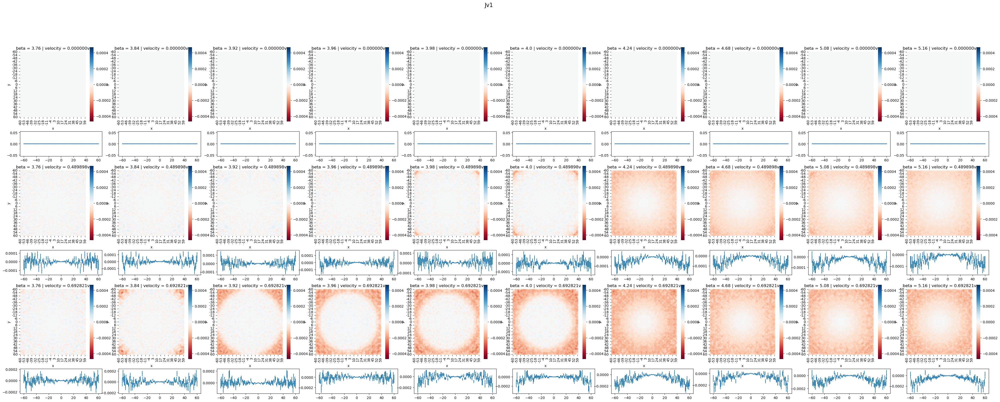

In [11]:
observable = 'Jv1'
df_0 = read_data('../../result/eos_rotation_imaginary/30x30x121sq/PBC_cV', observable)
df_T = read_data('../../result/eos_rotation_imaginary/5x30x121sq/PBC_cV', observable)
df_T[observable] = df_T[observable] - df_0[observable]
df_T[f'{observable}_err'] = np.sqrt(df_T[f'{observable}_err'] ** 2 + df_0[f'{observable}_err'] ** 2)
df_T = df_T[['x', 'y', observable, f'{observable}_err', 'beta', 'velocity']]
heatmap_errorbar(df_T, 3, observable, '../../images/eos_rotation_imaginary/30x30x121sq/PBC_cV', f'distribution_common_{observable}')

3.76
0.000000v
3.84
0.000000v
3.92
0.000000v
3.96
0.000000v
3.98
0.000000v
4.0
0.000000v
4.24
0.000000v
4.68
0.000000v
5.08
0.000000v
5.16
0.000000v
3.76
0.489898v
3.84
0.489898v
3.92
0.489898v
3.96
0.489898v
3.98
0.489898v
4.0
0.489898v
4.24
0.489898v
4.68
0.489898v
5.08
0.489898v
5.16
0.489898v
3.76
0.692821v
3.84
0.692821v
3.92
0.692821v
3.96
0.692821v
3.98
0.692821v
4.0
0.692821v
4.24
0.692821v
4.68
0.692821v
5.08
0.692821v
5.16
0.692821v
../../images/eos_rotation_imaginary/30x30x121sq/PBC_cV/distribution_common_Jv2


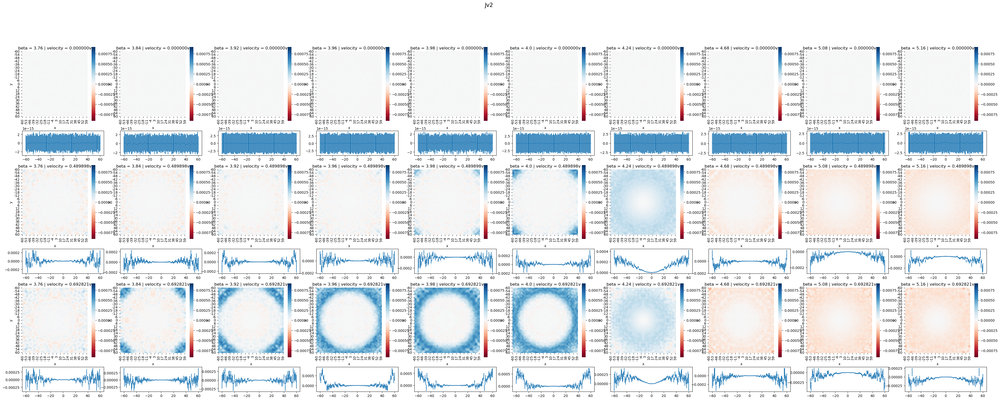

In [15]:
observable = 'Jv2'
df_0 = read_data('../../result/eos_rotation_imaginary/30x30x121sq/PBC_cV', observable)
df_T = read_data('../../result/eos_rotation_imaginary/5x30x121sq/PBC_cV', observable)
df_T[observable] = df_T[observable] - df_0[observable]
df_T[f'{observable}_err'] = np.sqrt(df_T[f'{observable}_err'] ** 2 + df_0[f'{observable}_err'] ** 2)
df_T = df_T[['x', 'y', observable, f'{observable}_err', 'beta', 'velocity']]
heatmap_errorbar(df_T, 3, observable, '../../images/eos_rotation_imaginary/30x30x121sq/PBC_cV', f'distribution_common_{observable}')

3.76
0.000000v
3.84
0.000000v
3.92
0.000000v
3.96
0.000000v
3.98
0.000000v
4.0
0.000000v
4.24
0.000000v
4.68
0.000000v
5.08
0.000000v
5.16
0.000000v
3.76
0.489898v
3.84
0.489898v
3.92
0.489898v
3.96
0.489898v
3.98
0.489898v
4.0
0.489898v
4.24
0.489898v
4.68
0.489898v
5.08
0.489898v
5.16
0.489898v
3.76
0.692821v
3.84
0.692821v
3.92
0.692821v
3.96
0.692821v
3.98
0.692821v
4.0
0.692821v
4.24
0.692821v
4.68
0.692821v
5.08
0.692821v
5.16
0.692821v
../../images/eos_rotation_imaginary/30x30x121sq/PBC_cV/distribution_common_Jv


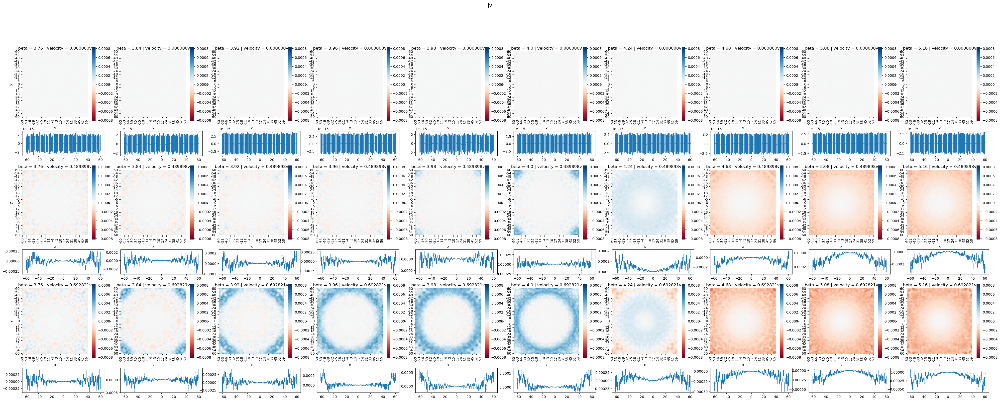

In [16]:
observable = 'Jv'
df_0 = read_data('../../result/eos_rotation_imaginary/30x30x121sq/PBC_cV', observable)
df_T = read_data('../../result/eos_rotation_imaginary/5x30x121sq/PBC_cV', observable)
df_T[observable] = df_T[observable] - df_0[observable]
df_T[f'{observable}_err'] = np.sqrt(df_T[f'{observable}_err'] ** 2 + df_0[f'{observable}_err'] ** 2)
df_T = df_T[['x', 'y', observable, f'{observable}_err', 'beta', 'velocity']]
heatmap_errorbar(df_T, 3, observable, '../../images/eos_rotation_imaginary/30x30x121sq/PBC_cV', f'distribution_common_{observable}')

[np.float64(0.020305603038936346), np.float64(0.5957887517146775), np.float64(0.0633570750237417), np.float64(0.09151577503429358)]
bbox1 Bbox(x0=0.020305603038936346, y0=0.5957887517146775, x1=0.08366267806267805, y1=0.687304526748971)
bbox Bbox(x0=0.020305603038936346, y0=0.687304526748971, x1=0.03931272554605886, y1=0.7696687242798352)
[np.float64(0.11938804605887937), np.float64(0.5957887517146775), np.float64(0.06335707502374169), np.float64(0.09151577503429358)]
bbox1 Bbox(x0=0.11938804605887937, y0=0.5957887517146775, x1=0.18274512108262106, y1=0.687304526748971)
bbox Bbox(x0=0.11938804605887937, y0=0.687304526748971, x1=0.13839516856600187, y1=0.7696687242798352)
[np.float64(0.21847048907882233), np.float64(0.5957887517146775), np.float64(0.06335707502374172), np.float64(0.09151577503429358)]
bbox1 Bbox(x0=0.21847048907882233, y0=0.5957887517146775, x1=0.28182756410256404, y1=0.687304526748971)
bbox Bbox(x0=0.21847048907882236, y0=0.687304526748971, x1=0.23747761158594485, y1=0

/home/ilya/anaconda3/envs/python3.12/lib/python3.12/site-packages/seaborn/axisgrid.py:123: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  self._figure.tight_layout(*args, **kwargs)


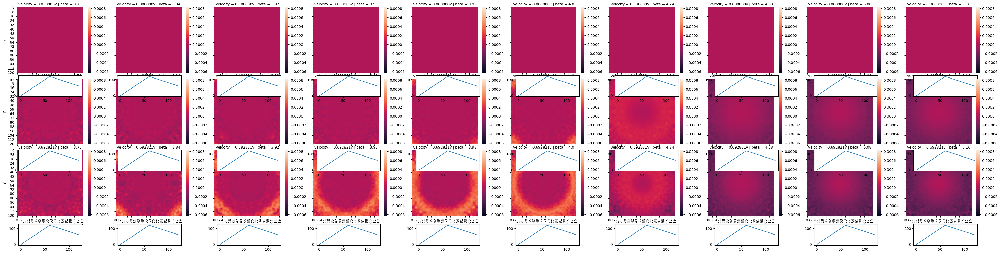

In [142]:
observable = 'Jv'
df_0 = read_data('../../result/eos_rotation_imaginary/30x30x121sq/PBC_cV', observable)
df_0['temp'] = '0'
df_T = read_data('../../result/eos_rotation_imaginary/5x30x121sq/PBC_cV', observable)
df_0['temp'] = 'T'
df_T[observable] = df_T[observable] - df_0[observable]
# df = pd.concat([df_0, df_T])
vmin = df_T[observable].min()
vmax = df_T[observable].max()
fg = seaborn.FacetGrid(data=df_T, col='beta', row='velocity', aspect=1.3)
fg.map_dataframe(heatmap_grid, vmin=vmin, vmax=vmax, observable=observable)
plots.save_image('../../images/eos_rotation_imaginary/30x30x121sq/PBC_cV', 'distribution_common', fg)
# df_T.groupby(['velocity', 'beta']).apply(plot_heatmap, observable, vmin, vmax)

0.000000v 3.76
       x    y            Jv
0      0    0  3.574256e-17
1      0    1  3.894322e-17
2      0    2  5.215857e-17
3      0    3  7.588439e-17
4      0    4  6.234763e-17
..   ...  ...           ...
116  120  116  6.234763e-17
117  120  117  7.588439e-17
118  120  118  5.215857e-17
119  120  119  3.894322e-17
120  120  120  3.574256e-17

[14641 rows x 3 columns]


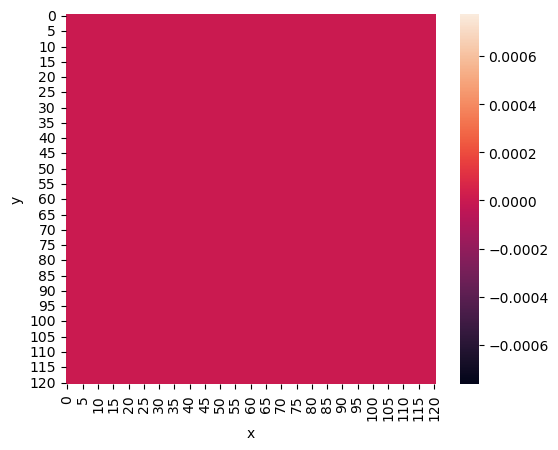

0.000000v 3.84
       x    y            Jv
0      0    0  2.927567e-17
1      0    1  4.690868e-17
2      0    2  6.471157e-17
3      0    3  6.109096e-17
4      0    4  3.312849e-17
..   ...  ...           ...
116  120  116  3.312849e-17
117  120  117  6.109096e-17
118  120  118  6.471157e-17
119  120  119  4.690868e-17
120  120  120  2.927567e-17

[14641 rows x 3 columns]


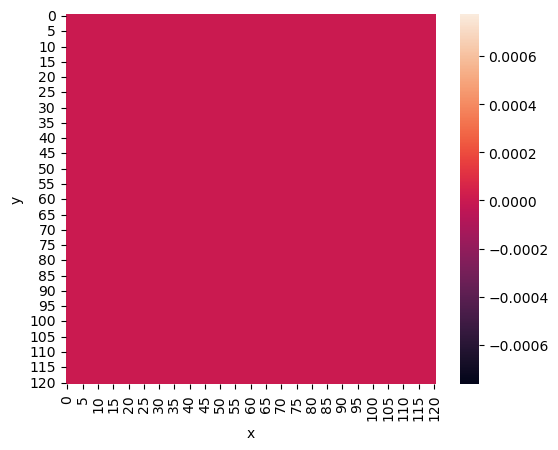

0.000000v 3.92
       x    y            Jv
0      0    0 -1.153448e-17
1      0    1  3.708180e-19
2      0    2  5.179024e-19
3      0    3 -1.067068e-17
4      0    4 -1.365716e-17
..   ...  ...           ...
116  120  116 -1.365716e-17
117  120  117 -1.067068e-17
118  120  118  5.179024e-19
119  120  119  3.708180e-19
120  120  120 -1.153448e-17

[14641 rows x 3 columns]


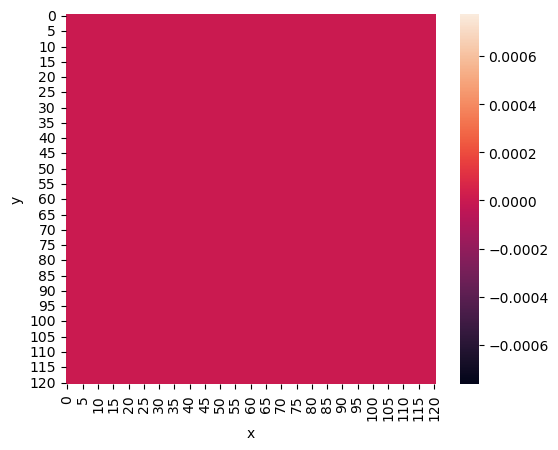

0.000000v 3.96
       x    y            Jv
0      0    0  4.402700e-17
1      0    1  3.490693e-17
2      0    2  3.626668e-17
3      0    3  3.732907e-17
4      0    4  2.257952e-17
..   ...  ...           ...
116  120  116  2.257952e-17
117  120  117  3.732907e-17
118  120  118  3.626668e-17
119  120  119  3.490693e-17
120  120  120  4.402700e-17

[14641 rows x 3 columns]


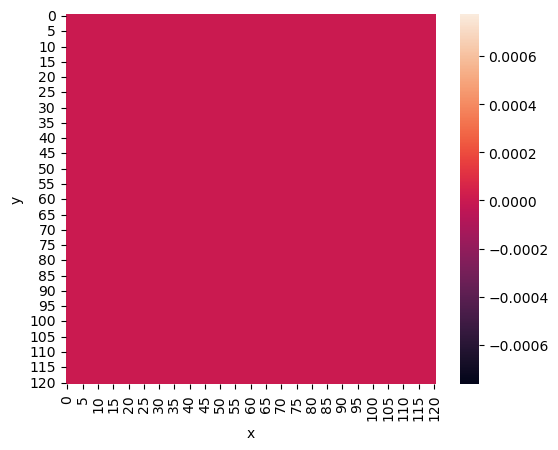

0.000000v 3.98
       x    y            Jv
0      0    0  2.038581e-17
1      0    1  4.033375e-17
2      0    2  4.382050e-17
3      0    3  2.200567e-17
4      0    4  7.501125e-18
..   ...  ...           ...
116  120  116  7.501125e-18
117  120  117  2.200567e-17
118  120  118  4.382050e-17
119  120  119  4.033375e-17
120  120  120  2.038581e-17

[14641 rows x 3 columns]


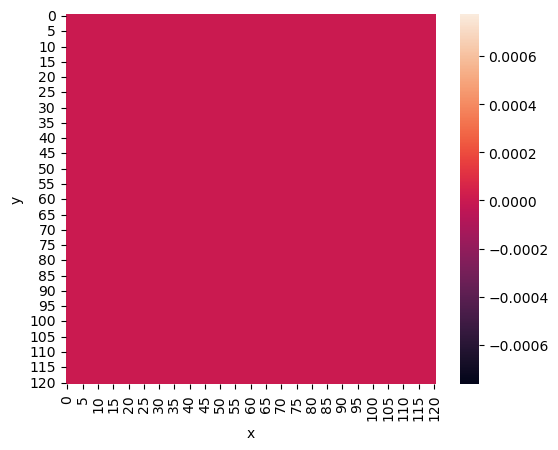

0.000000v 4.0
       x    y            Jv
0      0    0 -2.214093e-17
1      0    1  1.243292e-17
2      0    2  3.844035e-17
3      0    3  3.205988e-17
4      0    4  1.409031e-17
..   ...  ...           ...
116  120  116  1.409031e-17
117  120  117  3.205988e-17
118  120  118  3.844035e-17
119  120  119  1.243292e-17
120  120  120 -2.214093e-17

[14641 rows x 3 columns]


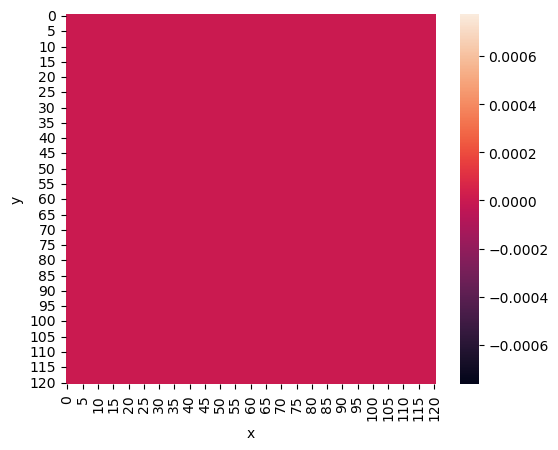

0.000000v 4.24
       x    y            Jv
0      0    0  1.911962e-17
1      0    1  1.924602e-17
2      0    2 -3.816189e-18
3      0    3 -1.355116e-17
4      0    4  2.364361e-17
..   ...  ...           ...
116  120  116  2.364361e-17
117  120  117 -1.355116e-17
118  120  118 -3.816189e-18
119  120  119  1.924602e-17
120  120  120  1.911962e-17

[14641 rows x 3 columns]


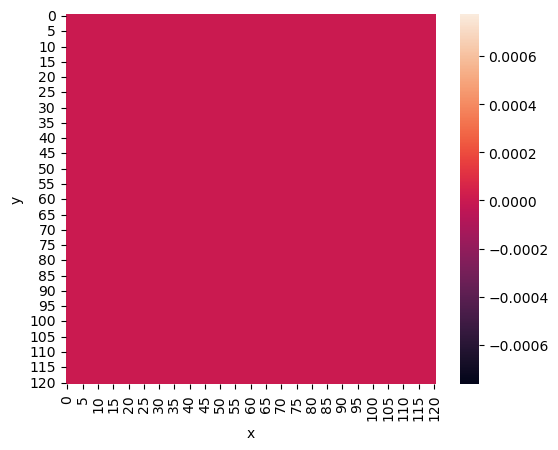

0.000000v 4.68
       x    y            Jv
0      0    0  2.341540e-17
1      0    1  2.483870e-17
2      0    2  1.005976e-17
3      0    3 -6.318153e-18
4      0    4  6.329092e-19
..   ...  ...           ...
116  120  116  6.329092e-19
117  120  117 -6.318153e-18
118  120  118  1.005976e-17
119  120  119  2.483870e-17
120  120  120  2.341540e-17

[14641 rows x 3 columns]


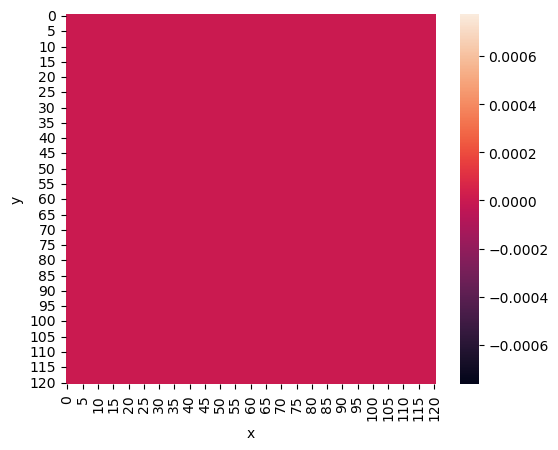

0.000000v 5.08
       x    y            Jv
0      0    0 -2.461935e-20
1      0    1  1.044979e-17
2      0    2  2.599325e-17
3      0    3  2.848839e-17
4      0    4  1.941902e-17
..   ...  ...           ...
116  120  116  1.941902e-17
117  120  117  2.848839e-17
118  120  118  2.599325e-17
119  120  119  1.044979e-17
120  120  120 -2.461935e-20

[14641 rows x 3 columns]


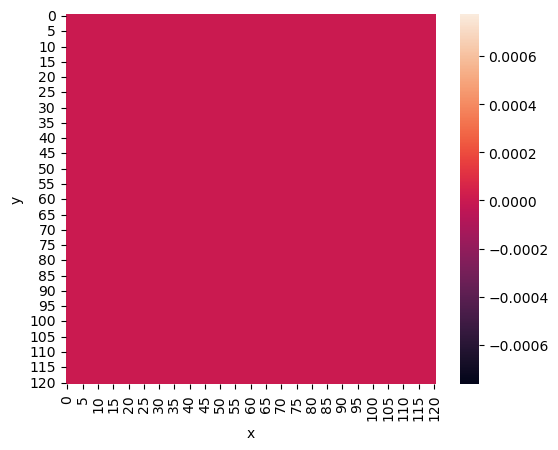

0.000000v 5.16
       x    y            Jv
0      0    0  9.712877e-19
1      0    1 -3.026584e-17
2      0    2 -5.076757e-17
3      0    3 -4.833233e-17
4      0    4 -3.435817e-17
..   ...  ...           ...
116  120  116 -3.435817e-17
117  120  117 -4.833233e-17
118  120  118 -5.076757e-17
119  120  119 -3.026584e-17
120  120  120  9.712877e-19

[14641 rows x 3 columns]


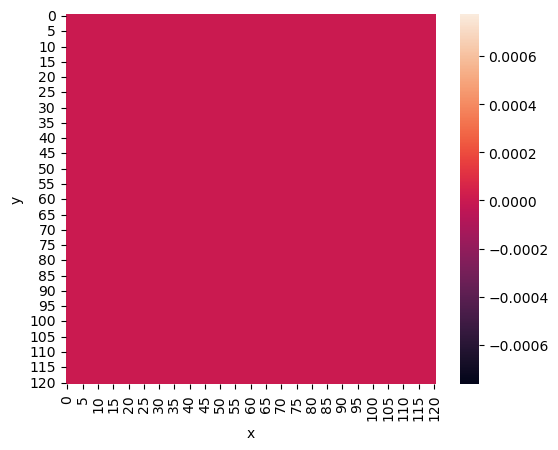

0.489898v 3.76
       x    y        Jv
0      0    0 -0.000017
1      0    1 -0.000029
2      0    2 -0.000019
3      0    3 -0.000016
4      0    4 -0.000021
..   ...  ...       ...
116  120  116 -0.000021
117  120  117 -0.000016
118  120  118 -0.000019
119  120  119 -0.000029
120  120  120 -0.000017

[14641 rows x 3 columns]


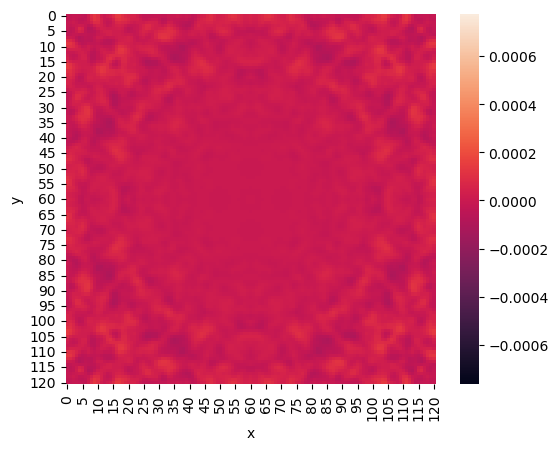

0.489898v 3.84
       x    y        Jv
0      0    0 -0.000077
1      0    1 -0.000096
2      0    2 -0.000121
3      0    3 -0.000138
4      0    4 -0.000112
..   ...  ...       ...
116  120  116 -0.000112
117  120  117 -0.000138
118  120  118 -0.000121
119  120  119 -0.000096
120  120  120 -0.000077

[14641 rows x 3 columns]


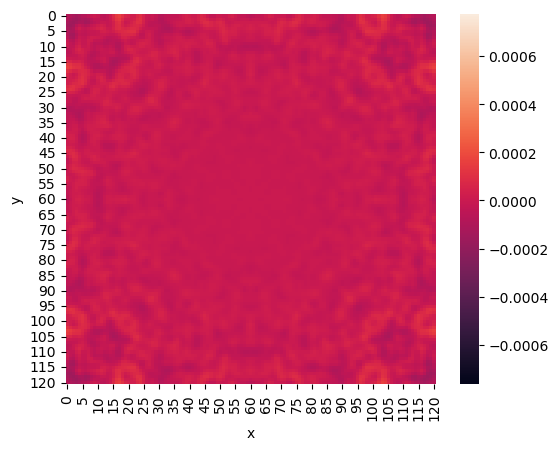

0.489898v 3.92
       x    y        Jv
0      0    0 -0.000132
1      0    1 -0.000113
2      0    2 -0.000080
3      0    3 -0.000029
4      0    4 -0.000006
..   ...  ...       ...
116  120  116 -0.000006
117  120  117 -0.000029
118  120  118 -0.000080
119  120  119 -0.000113
120  120  120 -0.000132

[14641 rows x 3 columns]


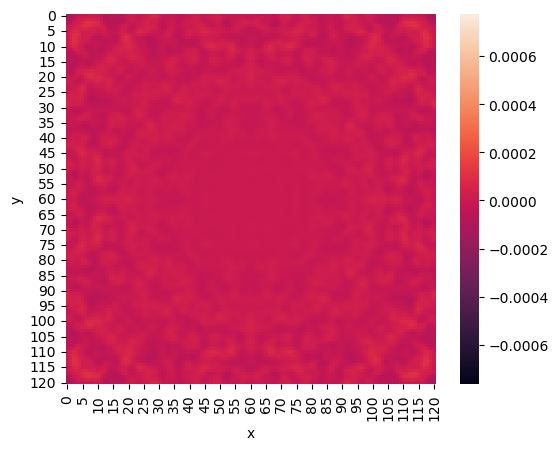

0.489898v 3.96
       x    y        Jv
0      0    0  0.000089
1      0    1  0.000064
2      0    2  0.000017
3      0    3 -0.000021
4      0    4 -0.000039
..   ...  ...       ...
116  120  116 -0.000039
117  120  117 -0.000021
118  120  118  0.000017
119  120  119  0.000064
120  120  120  0.000089

[14641 rows x 3 columns]


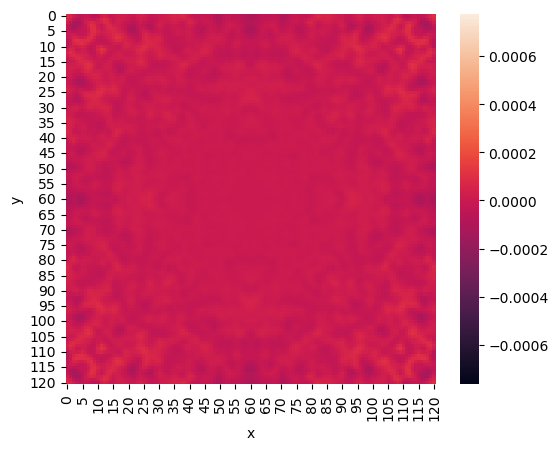

0.489898v 3.98
       x    y        Jv
0      0    0 -0.000013
1      0    1  0.000062
2      0    2  0.000137
3      0    3  0.000113
4      0    4  0.000028
..   ...  ...       ...
116  120  116  0.000028
117  120  117  0.000113
118  120  118  0.000137
119  120  119  0.000062
120  120  120 -0.000013

[14641 rows x 3 columns]


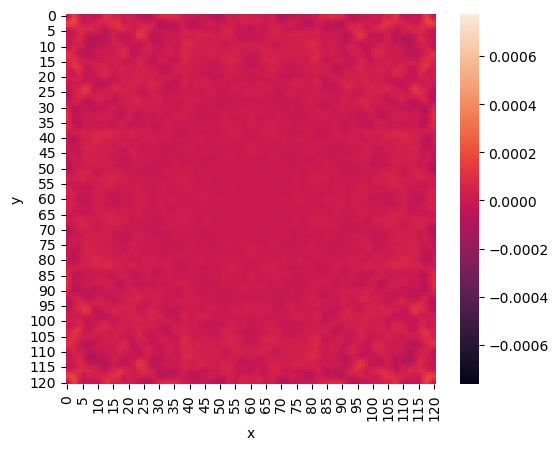

0.489898v 4.0
       x    y        Jv
0      0    0  0.000267
1      0    1  0.000235
2      0    2  0.000166
3      0    3  0.000096
4      0    4  0.000046
..   ...  ...       ...
116  120  116  0.000046
117  120  117  0.000096
118  120  118  0.000166
119  120  119  0.000235
120  120  120  0.000267

[14641 rows x 3 columns]


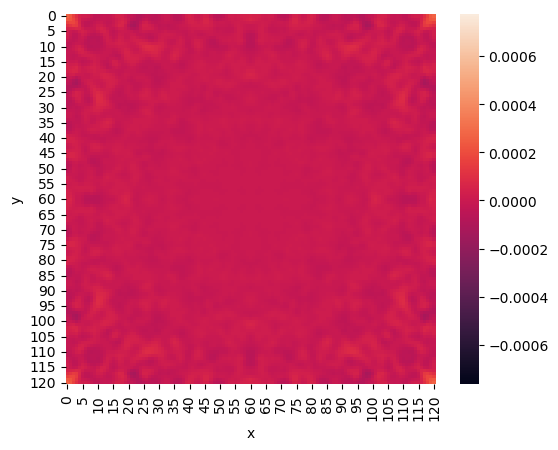

0.489898v 4.24
       x    y        Jv
0      0    0  0.000101
1      0    1  0.000056
2      0    2 -0.000004
3      0    3 -0.000018
4      0    4 -0.000016
..   ...  ...       ...
116  120  116 -0.000016
117  120  117 -0.000018
118  120  118 -0.000004
119  120  119  0.000056
120  120  120  0.000101

[14641 rows x 3 columns]


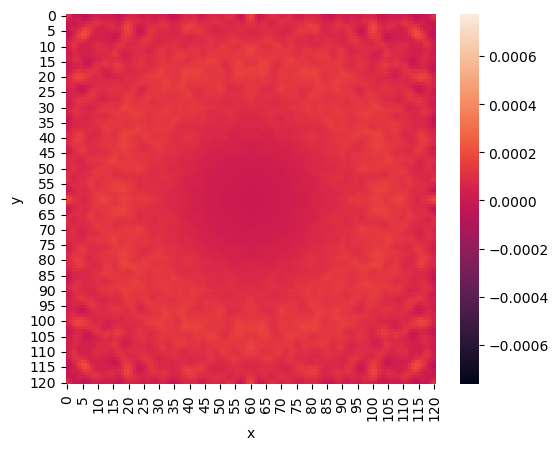

0.489898v 4.68
       x    y        Jv
0      0    0 -0.000055
1      0    1  0.000002
2      0    2  0.000068
3      0    3  0.000103
4      0    4  0.000097
..   ...  ...       ...
116  120  116  0.000097
117  120  117  0.000103
118  120  118  0.000068
119  120  119  0.000002
120  120  120 -0.000055

[14641 rows x 3 columns]


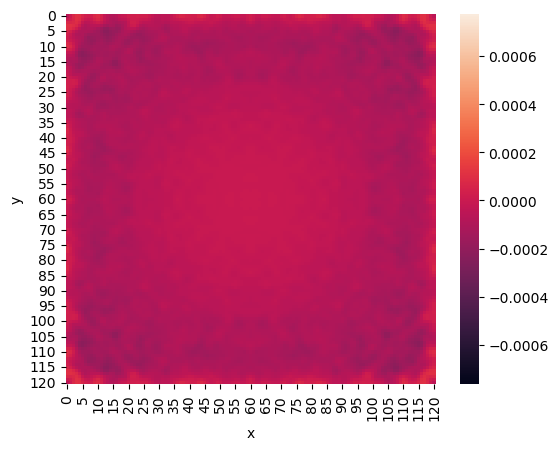

0.489898v 5.08
       x    y        Jv
0      0    0 -0.000051
1      0    1 -0.000039
2      0    2 -0.000055
3      0    3 -0.000087
4      0    4 -0.000106
..   ...  ...       ...
116  120  116 -0.000106
117  120  117 -0.000087
118  120  118 -0.000055
119  120  119 -0.000039
120  120  120 -0.000051

[14641 rows x 3 columns]


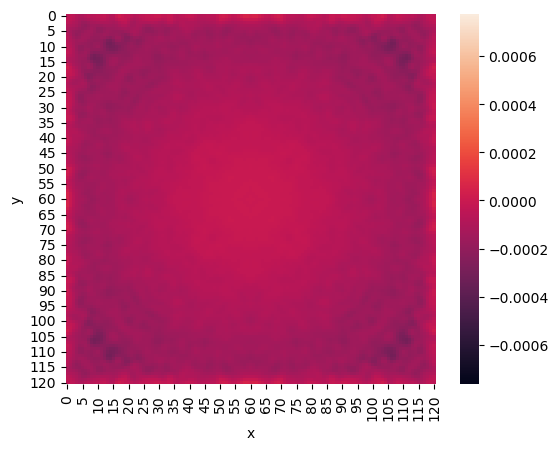

0.489898v 5.16
       x    y        Jv
0      0    0 -0.000007
1      0    1 -0.000025
2      0    2 -0.000032
3      0    3 -0.000049
4      0    4 -0.000079
..   ...  ...       ...
116  120  116 -0.000079
117  120  117 -0.000049
118  120  118 -0.000032
119  120  119 -0.000025
120  120  120 -0.000007

[14641 rows x 3 columns]


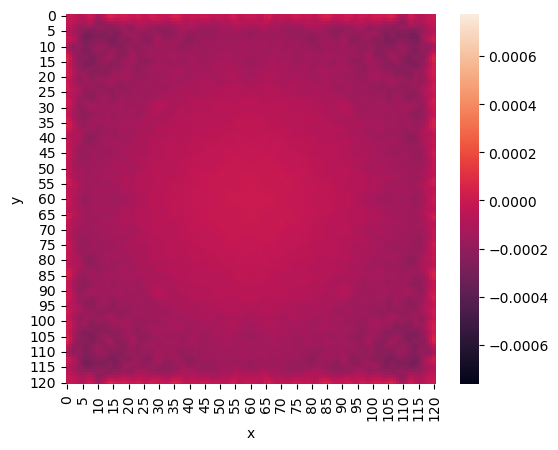

0.692821v 3.76
       x    y        Jv
0      0    0  0.000029
1      0    1 -0.000009
2      0    2 -0.000056
3      0    3 -0.000064
4      0    4 -0.000066
..   ...  ...       ...
116  120  116 -0.000066
117  120  117 -0.000064
118  120  118 -0.000056
119  120  119 -0.000009
120  120  120  0.000029

[14641 rows x 3 columns]


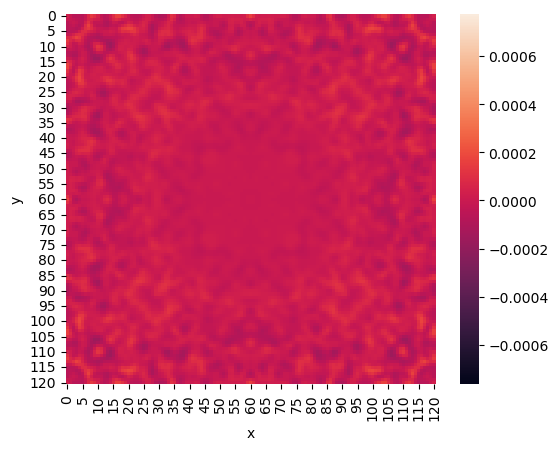

0.692821v 3.84
       x    y        Jv
0      0    0 -0.000026
1      0    1 -0.000045
2      0    2 -0.000019
3      0    3  0.000025
4      0    4 -0.000004
..   ...  ...       ...
116  120  116 -0.000004
117  120  117  0.000025
118  120  118 -0.000019
119  120  119 -0.000045
120  120  120 -0.000026

[14641 rows x 3 columns]


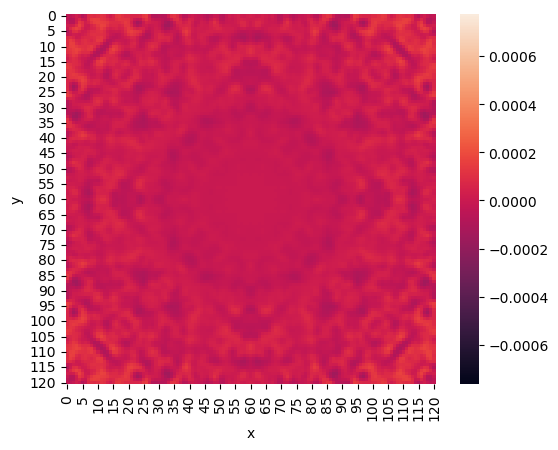

0.692821v 3.92
       x    y        Jv
0      0    0 -0.000166
1      0    1 -0.000077
2      0    2 -0.000034
3      0    3 -0.000095
4      0    4 -0.000119
..   ...  ...       ...
116  120  116 -0.000119
117  120  117 -0.000095
118  120  118 -0.000034
119  120  119 -0.000077
120  120  120 -0.000166

[14641 rows x 3 columns]


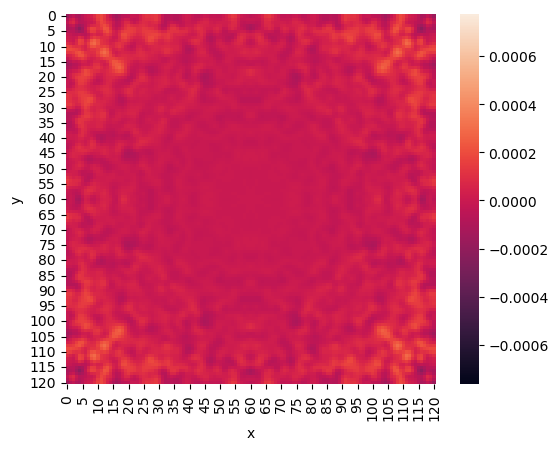

0.692821v 3.96
       x    y        Jv
0      0    0  0.000257
1      0    1  0.000199
2      0    2  0.000102
3      0    3  0.000046
4      0    4  0.000033
..   ...  ...       ...
116  120  116  0.000033
117  120  117  0.000046
118  120  118  0.000102
119  120  119  0.000199
120  120  120  0.000257

[14641 rows x 3 columns]


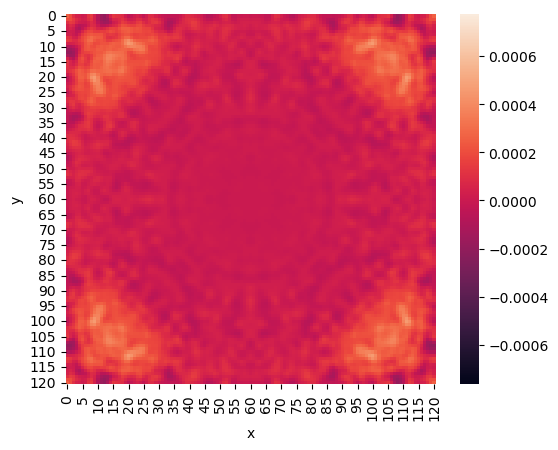

0.692821v 3.98
       x    y        Jv
0      0    0 -0.000178
1      0    1 -0.000208
2      0    2 -0.000184
3      0    3 -0.000121
4      0    4 -0.000073
..   ...  ...       ...
116  120  116 -0.000073
117  120  117 -0.000121
118  120  118 -0.000184
119  120  119 -0.000208
120  120  120 -0.000178

[14641 rows x 3 columns]


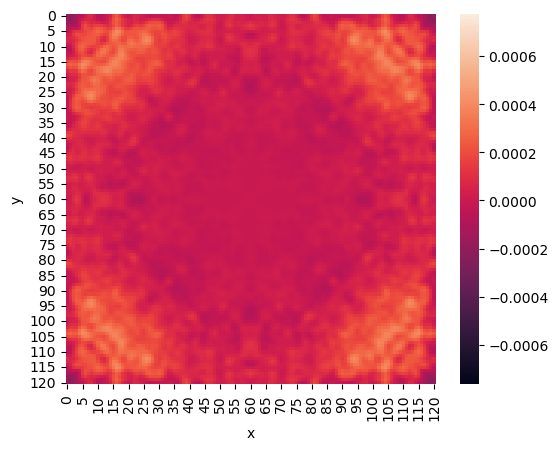

0.692821v 4.0
       x    y        Jv
0      0    0 -0.000237
1      0    1 -0.000327
2      0    2 -0.000284
3      0    3 -0.000085
4      0    4  0.000092
..   ...  ...       ...
116  120  116  0.000092
117  120  117 -0.000085
118  120  118 -0.000284
119  120  119 -0.000327
120  120  120 -0.000237

[14641 rows x 3 columns]


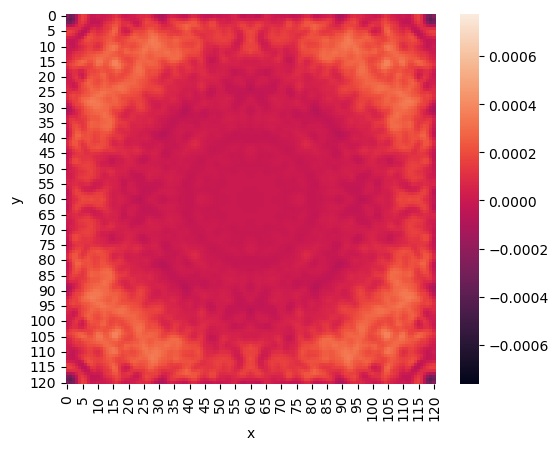

0.692821v 4.24
       x    y        Jv
0      0    0  0.000012
1      0    1 -0.000002
2      0    2 -0.000050
3      0    3 -0.000077
4      0    4 -0.000050
..   ...  ...       ...
116  120  116 -0.000050
117  120  117 -0.000077
118  120  118 -0.000050
119  120  119 -0.000002
120  120  120  0.000012

[14641 rows x 3 columns]


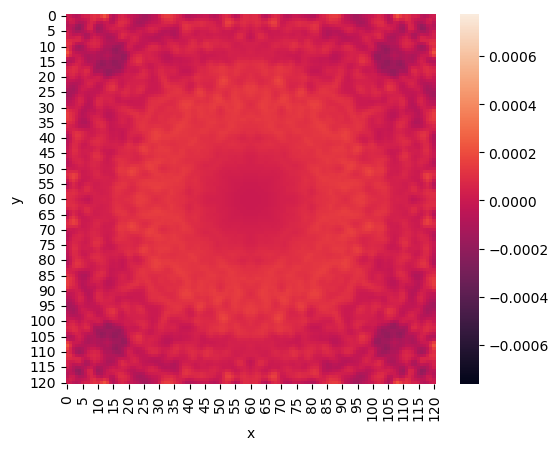

0.692821v 4.68
       x    y        Jv
0      0    0  0.000222
1      0    1  0.000208
2      0    2  0.000079
3      0    3 -0.000060
4      0    4 -0.000066
..   ...  ...       ...
116  120  116 -0.000066
117  120  117 -0.000060
118  120  118  0.000079
119  120  119  0.000208
120  120  120  0.000222

[14641 rows x 3 columns]


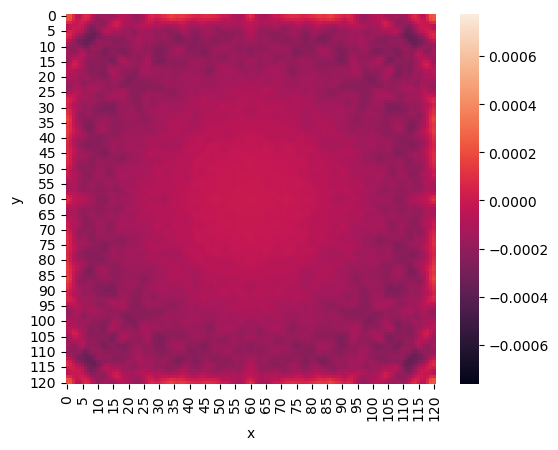

0.692821v 5.08
       x    y        Jv
0      0    0  0.000016
1      0    1  0.000091
2      0    2  0.000115
3      0    3  0.000076
4      0    4  0.000039
..   ...  ...       ...
116  120  116  0.000039
117  120  117  0.000076
118  120  118  0.000115
119  120  119  0.000091
120  120  120  0.000016

[14641 rows x 3 columns]


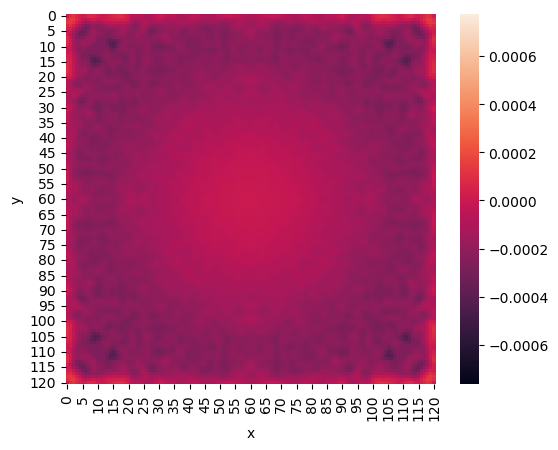

0.692821v 5.16
       x    y        Jv
0      0    0  0.000142
1      0    1  0.000049
2      0    2 -0.000063
3      0    3 -0.000108
4      0    4 -0.000083
..   ...  ...       ...
116  120  116 -0.000083
117  120  117 -0.000108
118  120  118 -0.000063
119  120  119  0.000049
120  120  120  0.000142

[14641 rows x 3 columns]


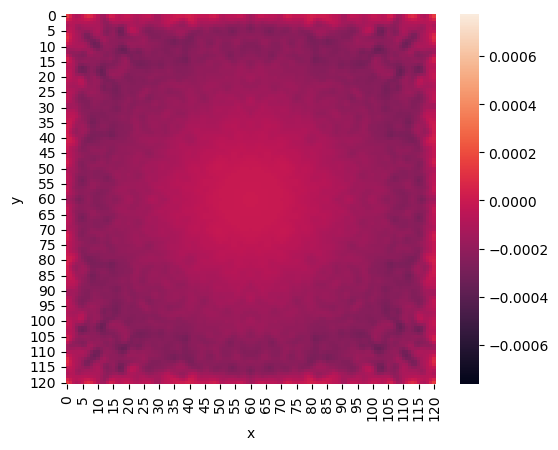

/tmp/ipykernel_899/1814860926.py:10: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_T.groupby(['velocity', 'beta']).apply(plot_heatmap, observable, vmin, vmax)


""


In [34]:
observable = 'Jv'
df_0 = read_data('../../result/eos_rotation_imaginary/30x30x121sq/OBCb_cV', observable)
df_0['temp'] = '0'
df_T = read_data('../../result/eos_rotation_imaginary/5x30x121sq/OBCb_cV', observable)
df_0['temp'] = 'T'
df_T[observable] = df_T[observable] - df_0[observable]
# df = pd.concat([df_0, df_T])
vmin = df_T[observable].min()
vmax = df_T[observable].max()
df_T.groupby(['velocity', 'beta']).apply(plot_heatmap, observable, vmin, vmax)

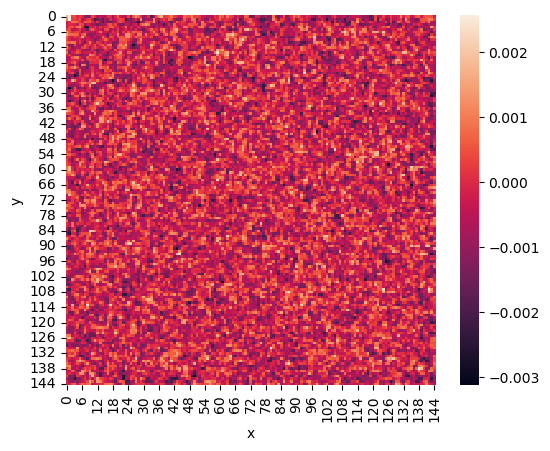

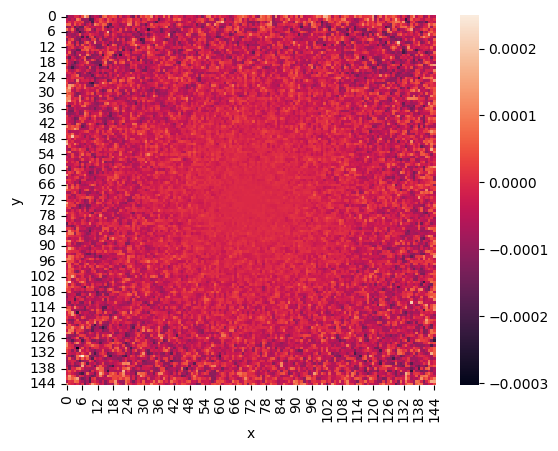

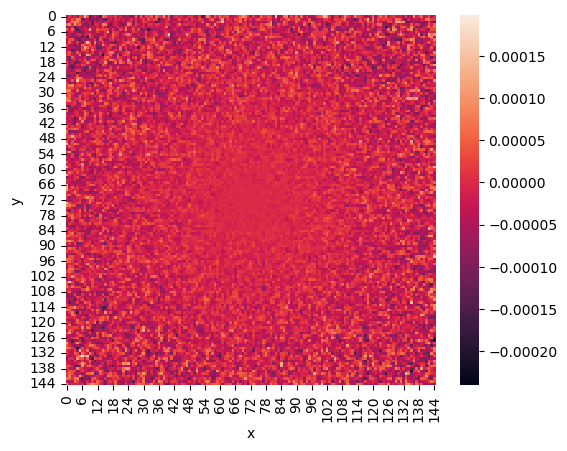

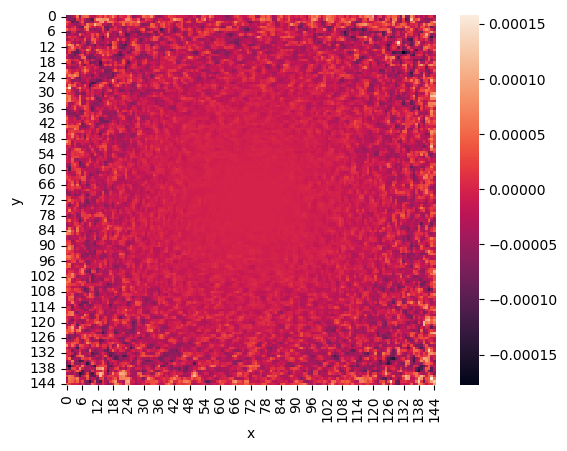

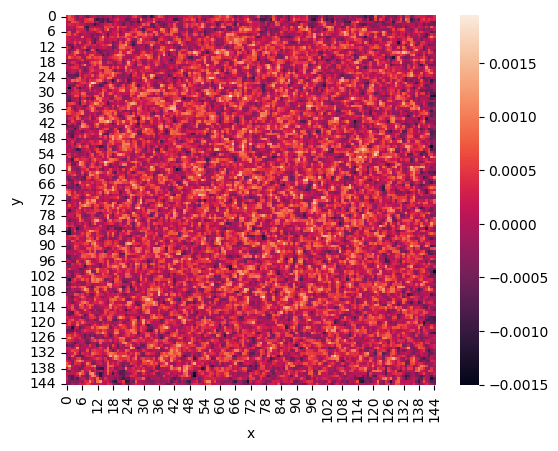

...

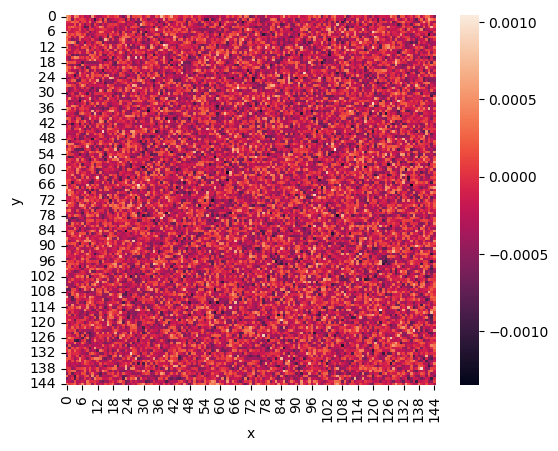

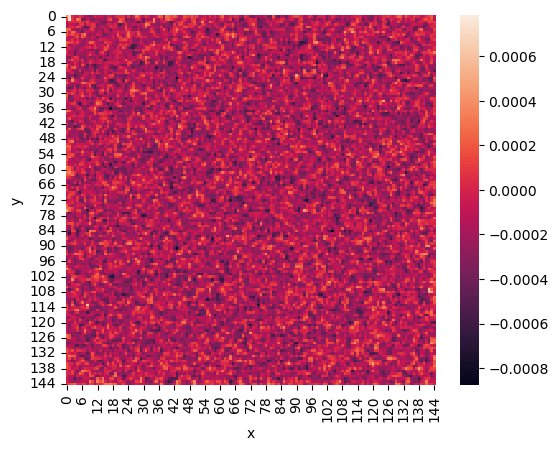

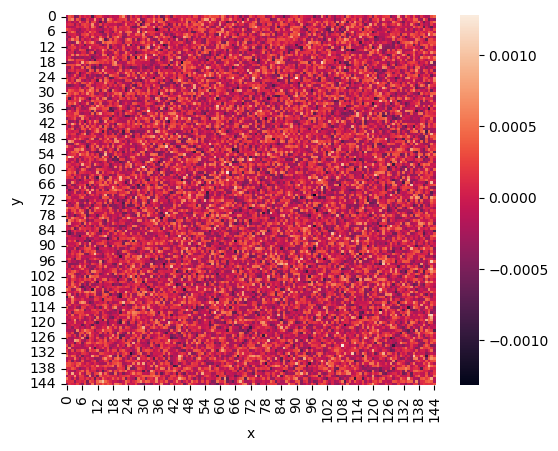

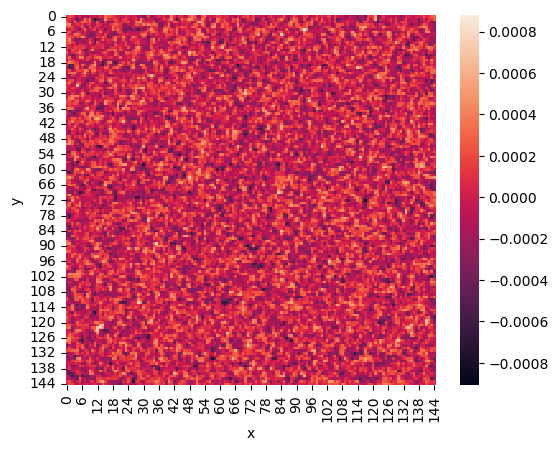

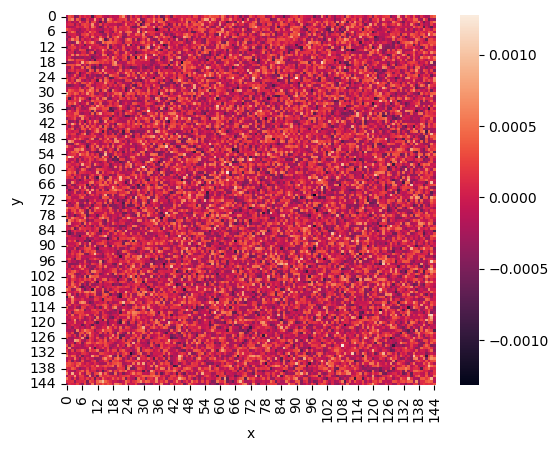

In [55]:
make_heatmap1('../../result/eos_rotation_imaginary/36x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution.csv', '../../result/eos_rotation_imaginary/6x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution.csv', 'S')
make_heatmap1('../../result/eos_rotation_imaginary/36x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution.csv', '../../result/eos_rotation_imaginary/6x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution.csv', 'Jv')
make_heatmap1('../../result/eos_rotation_imaginary/36x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution.csv', '../../result/eos_rotation_imaginary/6x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution.csv', 'Jv1')
make_heatmap1('../../result/eos_rotation_imaginary/36x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution.csv', '../../result/eos_rotation_imaginary/6x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution.csv', 'Jv2')
make_heatmap1('../../result/eos_rotation_imaginary/36x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution.csv', '../../result/eos_rotation_imaginary/6x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution.csv', 'Blab')
make_heatmap1('../../result/eos_rotation_imaginary/36x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution.csv', '../../result/eos_rotation_imaginary/6x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution.csv', 'E')
make_heatmap1('../../result/eos_rotation_imaginary/36x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution.csv', '../../result/eos_rotation_imaginary/6x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution.csv', 'Elab')
make_heatmap1('../../result/eos_rotation_imaginary/36x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution.csv', '../../result/eos_rotation_imaginary/6x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution.csv', 'Bz')
make_heatmap1('../../result/eos_rotation_imaginary/36x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution.csv', '../../result/eos_rotation_imaginary/6x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution.csv', 'Bxy')
make_heatmap1('../../result/eos_rotation_imaginary/36x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution.csv', '../../result/eos_rotation_imaginary/6x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution.csv', 'Ez')
make_heatmap1('../../result/eos_rotation_imaginary/36x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution.csv', '../../result/eos_rotation_imaginary/6x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution.csv', 'Exy')
make_heatmap1('../../result/eos_rotation_imaginary/36x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution.csv', '../../result/eos_rotation_imaginary/6x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution.csv', 'ElabzT')
make_heatmap1('../../result/eos_rotation_imaginary/36x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution.csv', '../../result/eos_rotation_imaginary/6x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution.csv', 'ElabxyT')
make_heatmap1('../../result/eos_rotation_imaginary/36x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution.csv', '../../result/eos_rotation_imaginary/6x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution.csv', 'Ae')
make_heatmap1('../../result/eos_rotation_imaginary/36x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution.csv', '../../result/eos_rotation_imaginary/6x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution.csv', 'Am')
make_heatmap1('../../result/eos_rotation_imaginary/36x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution.csv', '../../result/eos_rotation_imaginary/6x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution.csv', 'AlabeT')

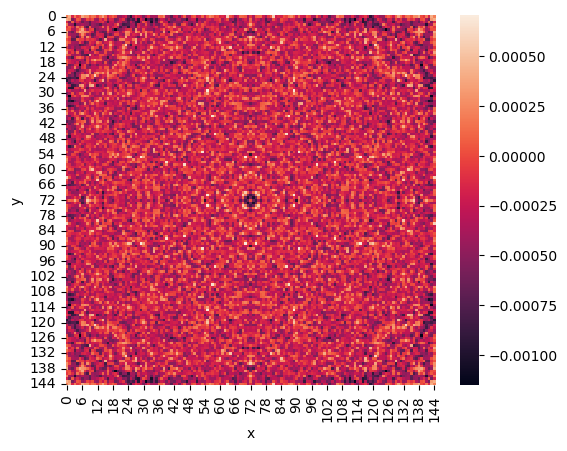

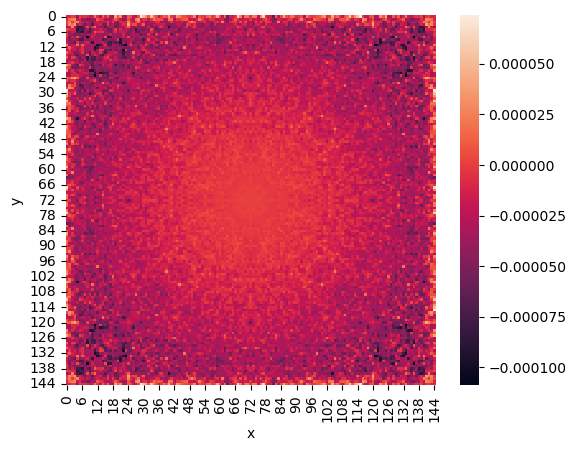

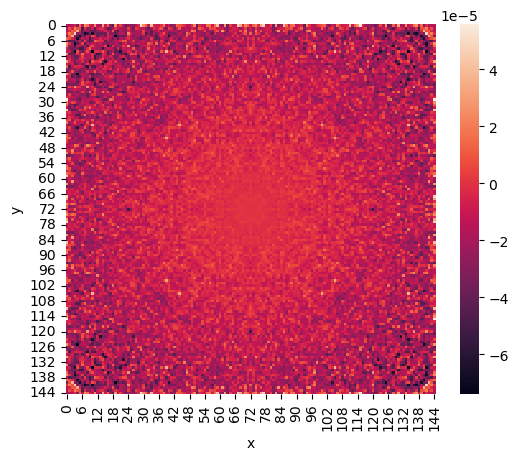

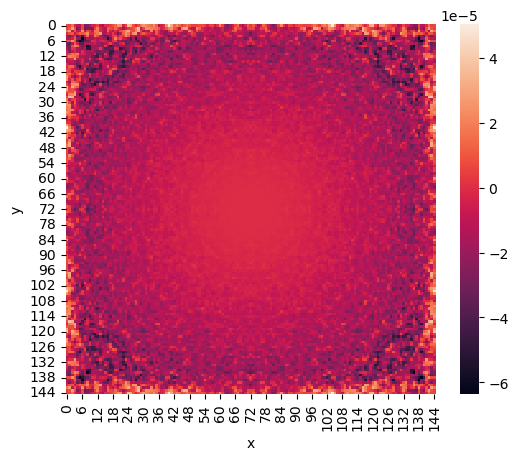

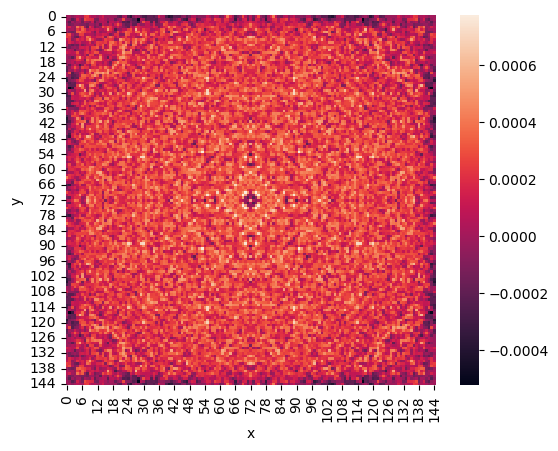

...

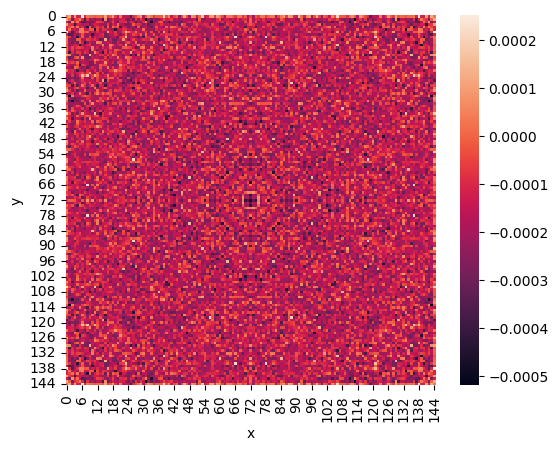

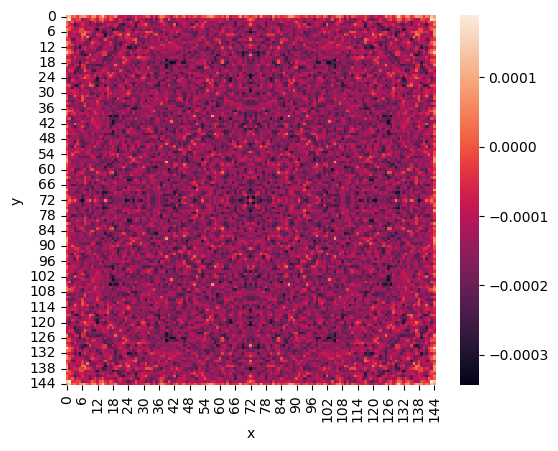

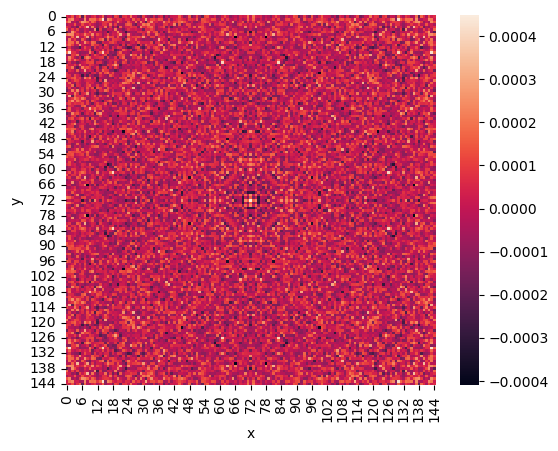

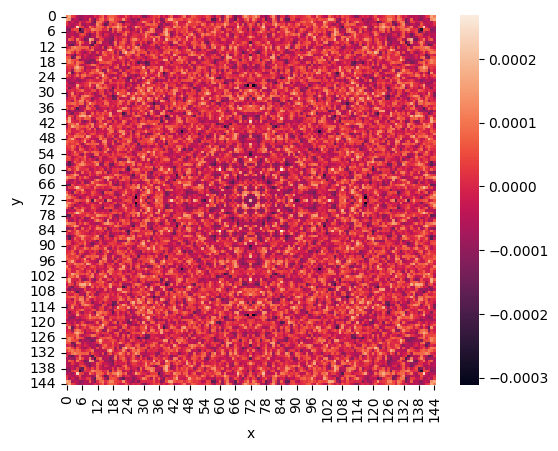

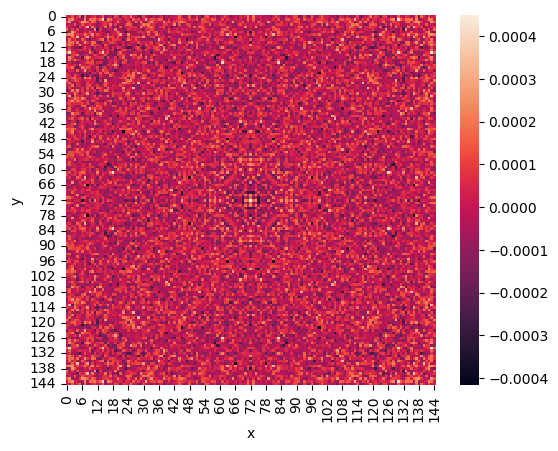

In [53]:
make_heatmap1('../../result/eos_rotation_imaginary/36x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution_aver.csv', '../../result/eos_rotation_imaginary/6x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution_aver.csv', 'S')
make_heatmap1('../../result/eos_rotation_imaginary/36x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution_aver.csv', '../../result/eos_rotation_imaginary/6x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution_aver.csv', 'Jv')
make_heatmap1('../../result/eos_rotation_imaginary/36x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution_aver.csv', '../../result/eos_rotation_imaginary/6x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution_aver.csv', 'Jv1')
make_heatmap1('../../result/eos_rotation_imaginary/36x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution_aver.csv', '../../result/eos_rotation_imaginary/6x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution_aver.csv', 'Jv2')
make_heatmap1('../../result/eos_rotation_imaginary/36x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution_aver.csv', '../../result/eos_rotation_imaginary/6x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution_aver.csv', 'Blab')
make_heatmap1('../../result/eos_rotation_imaginary/36x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution_aver.csv', '../../result/eos_rotation_imaginary/6x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution_aver.csv', 'E')
make_heatmap1('../../result/eos_rotation_imaginary/36x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution_aver.csv', '../../result/eos_rotation_imaginary/6x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution_aver.csv', 'Elab')
make_heatmap1('../../result/eos_rotation_imaginary/36x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution_aver.csv', '../../result/eos_rotation_imaginary/6x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution_aver.csv', 'Bz')
make_heatmap1('../../result/eos_rotation_imaginary/36x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution_aver.csv', '../../result/eos_rotation_imaginary/6x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution_aver.csv', 'Bxy')
make_heatmap1('../../result/eos_rotation_imaginary/36x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution_aver.csv', '../../result/eos_rotation_imaginary/6x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution_aver.csv', 'Ez')
make_heatmap1('../../result/eos_rotation_imaginary/36x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution_aver.csv', '../../result/eos_rotation_imaginary/6x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution_aver.csv', 'Exy')
make_heatmap1('../../result/eos_rotation_imaginary/36x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution_aver.csv', '../../result/eos_rotation_imaginary/6x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution_aver.csv', 'ElabzT')
make_heatmap1('../../result/eos_rotation_imaginary/36x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution_aver.csv', '../../result/eos_rotation_imaginary/6x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution_aver.csv', 'ElabxyT')
make_heatmap1('../../result/eos_rotation_imaginary/36x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution_aver.csv', '../../result/eos_rotation_imaginary/6x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution_aver.csv', 'Ae')
make_heatmap1('../../result/eos_rotation_imaginary/36x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution_aver.csv', '../../result/eos_rotation_imaginary/6x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution_aver.csv', 'Am')
make_heatmap1('../../result/eos_rotation_imaginary/36x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution_aver.csv', '../../result/eos_rotation_imaginary/6x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution_aver.csv', 'AlabeT')

         x    y         S     S_err        Jv    Jv_err       Jv1   Jv1_err  \
0        0    0  1.558467  0.000213 -0.057964  0.000021  0.009847  0.000019   
1        0    1  2.120824  0.000190 -0.108098  0.000024  0.015739  0.000013   
2        0    2  1.971792  0.000196 -0.105247  0.000026  0.015522  0.000022   
3        0    3  1.968152  0.000166 -0.104066  0.000022  0.015325  0.000021   
4        0    4  1.967950  0.000242 -0.102931  0.000024  0.015139  0.000019   
...    ...  ...       ...       ...       ...       ...       ...       ...   
21020  144  140  1.967950  0.000242 -0.102931  0.000024  0.015139  0.000019   
21021  144  141  1.968152  0.000166 -0.104066  0.000022  0.015325  0.000021   
21022  144  142  1.971792  0.000196 -0.105247  0.000026  0.015522  0.000022   
21023  144  143  2.120824  0.000190 -0.108098  0.000024  0.015739  0.000013   
21024  144  144  1.558467  0.000213 -0.057964  0.000021  0.009847  0.000019   

            Jv2   Jv2_err  ...  ElabzT_err   Elabxy

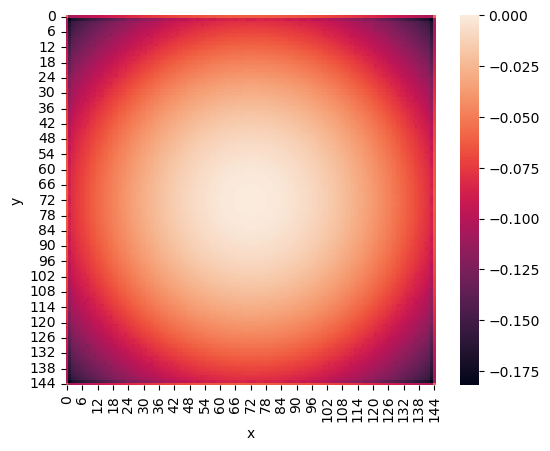

In [49]:
make_heatmap1('../../result/eos_rotation_imaginary/6x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution_aver.csv', 'Jv')

         x    y         S     S_err        Jv    Jv_err       Jv1   Jv1_err  \
0        0    0  1.597025  0.000427 -0.059026  0.000047  0.010861  0.000035   
1        0    1  2.139717  0.000586 -0.104043  0.000048  0.016109  0.000032   
2        0    2  1.973250  0.000501 -0.105021  0.000048  0.015489  0.000037   
3        0    3  1.968054  0.000401 -0.103975  0.000051  0.015396  0.000045   
4        0    4  1.968210  0.000439 -0.102998  0.000039  0.015101  0.000032   
...    ...  ...       ...       ...       ...       ...       ...       ...   
21020  144  140  1.967908  0.000520 -0.102955  0.000058  0.015119  0.000040   
21021  144  141  1.967644  0.000464 -0.104076  0.000053  0.015327  0.000036   
21022  144  142  1.970685  0.000549 -0.105252  0.000052  0.015596  0.000052   
21023  144  143  2.114409  0.000606 -0.109351  0.000067  0.015680  0.000045   
21024  144  144  1.545885  0.000430 -0.057648  0.000046  0.009462  0.000034   

            Jv2   Jv2_err  ...  ElabzT_err   Elabxy

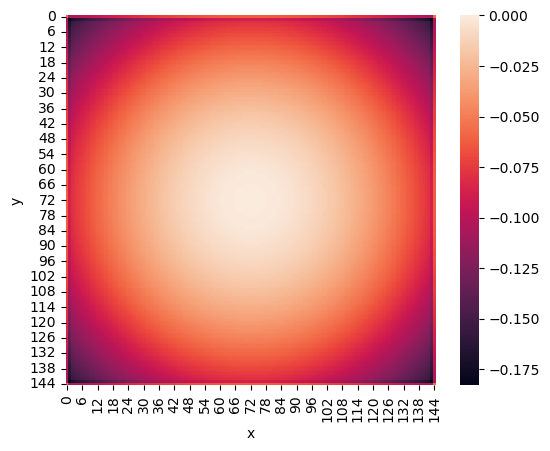

In [34]:
make_heatmap1('../../result/eos_rotation_imaginary/6x36x145sq/OBCb_cV/0.282843v/5.3200/observables_distribution.csv')

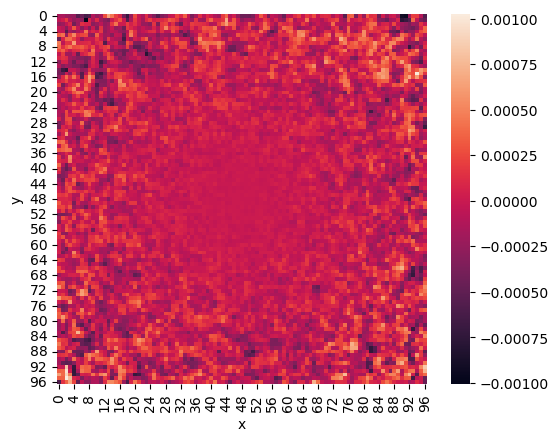

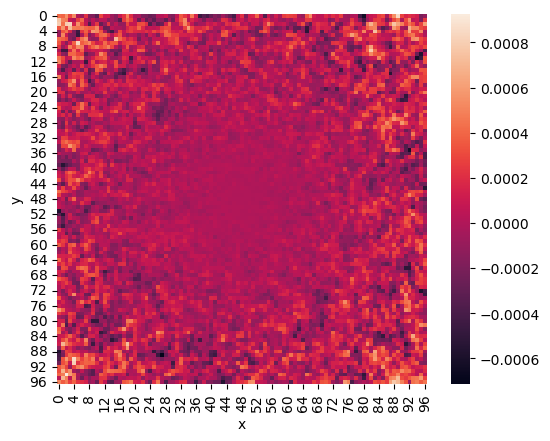

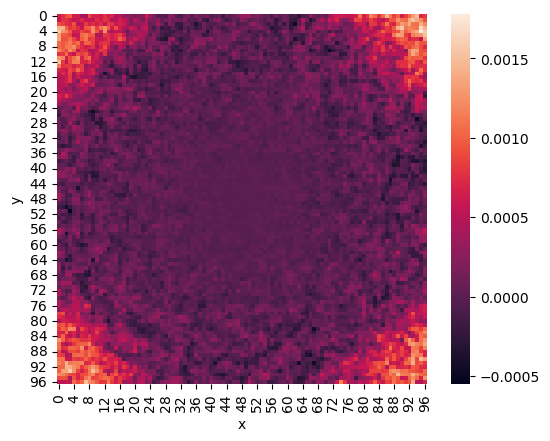

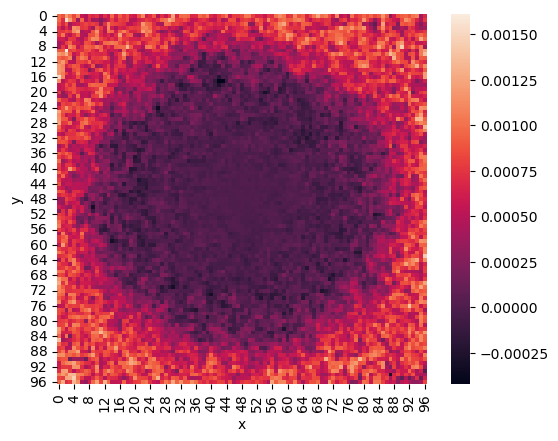

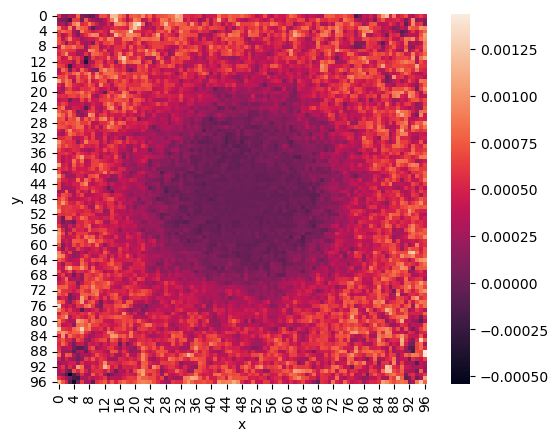

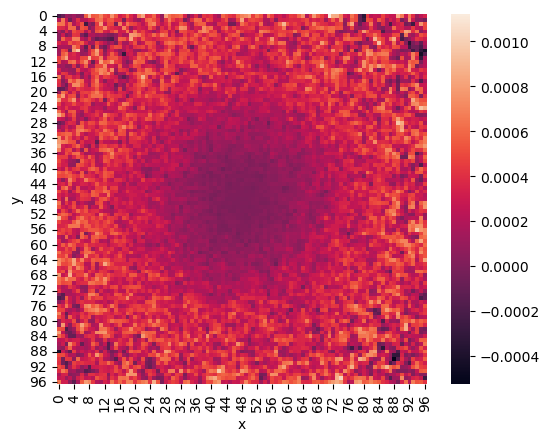

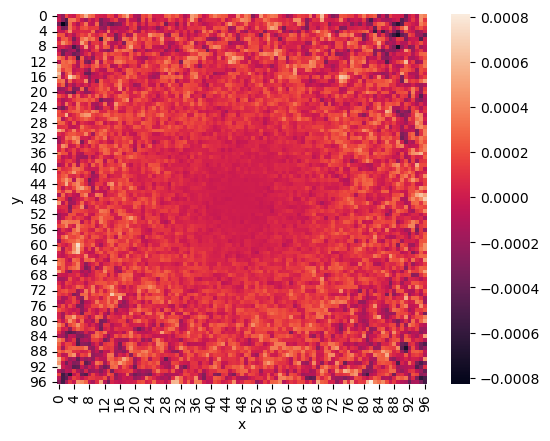

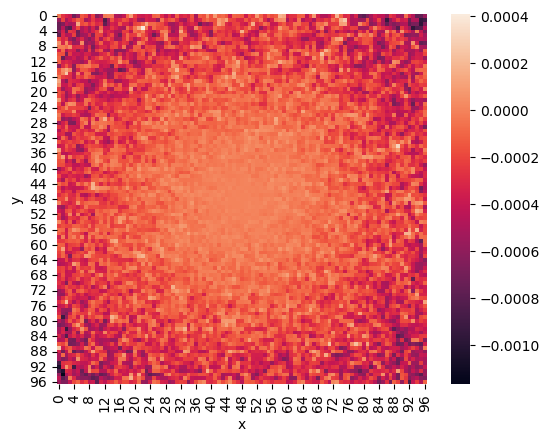

In [24]:
make_heatmap('../../result/eos_rotation_imaginary/24x24x97sq/PBC_cV/0.400000v/xy_Jv_3.8000.txt', '../../result/eos_rotation_imaginary/4x24x97sq/PBC_cV/0.400000v/xy_Jv_3.8000.txt')
make_heatmap('../../result/eos_rotation_imaginary/24x24x97sq/PBC_cV/0.400000v/xy_Jv_3.9200.txt', '../../result/eos_rotation_imaginary/4x24x97sq/PBC_cV/0.400000v/xy_Jv_3.9200.txt')
make_heatmap('../../result/eos_rotation_imaginary/24x24x97sq/PBC_cV/0.400000v/xy_Jv_3.9500.txt', '../../result/eos_rotation_imaginary/4x24x97sq/PBC_cV/0.400000v/xy_Jv_3.9500.txt')
make_heatmap('../../result/eos_rotation_imaginary/24x24x97sq/PBC_cV/0.400000v/xy_Jv_4.0000.txt', '../../result/eos_rotation_imaginary/4x24x97sq/PBC_cV/0.400000v/xy_Jv_4.0000.txt')
make_heatmap('../../result/eos_rotation_imaginary/24x24x97sq/PBC_cV/0.400000v/xy_Jv_4.0500.txt', '../../result/eos_rotation_imaginary/4x24x97sq/PBC_cV/0.400000v/xy_Jv_4.0500.txt')
make_heatmap('../../result/eos_rotation_imaginary/24x24x97sq/PBC_cV/0.400000v/xy_Jv_4.1000.txt', '../../result/eos_rotation_imaginary/4x24x97sq/PBC_cV/0.400000v/xy_Jv_4.1000.txt')
make_heatmap('../../result/eos_rotation_imaginary/24x24x97sq/PBC_cV/0.400000v/xy_Jv_4.2000.txt', '../../result/eos_rotation_imaginary/4x24x97sq/PBC_cV/0.400000v/xy_Jv_4.2000.txt')
make_heatmap('../../result/eos_rotation_imaginary/24x24x97sq/PBC_cV/0.400000v/xy_Jv_4.5200.txt', '../../result/eos_rotation_imaginary/4x24x97sq/PBC_cV/0.400000v/xy_Jv_4.5200.txt')

       x   y    J  err
0      0   0  0.0  0.0
1      0   1  0.0  0.0
2      0   2 -0.0  0.0
3      0   3 -0.0  0.0
4      0   4 -0.0  0.0
...   ..  ..  ...  ...
9404  96  92  0.0  0.0
9405  96  93 -0.0  0.0
9406  96  94 -0.0  0.0
9407  96  95 -0.0  0.0
9408  96  96  0.0  0.0

[9409 rows x 4 columns]


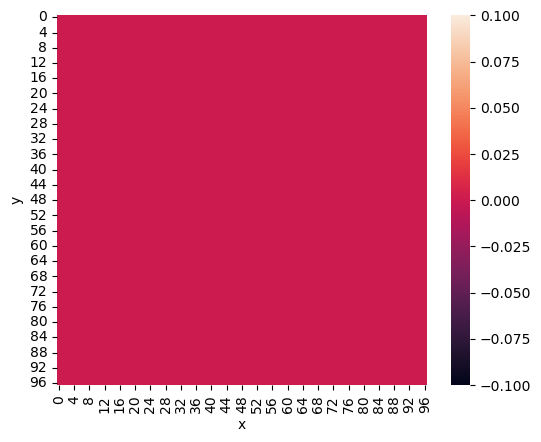

       x   y    J  err
0      0   0 -0.0  0.0
1      0   1 -0.0  0.0
2      0   2  0.0  0.0
3      0   3 -0.0  0.0
4      0   4  0.0  0.0
...   ..  ..  ...  ...
9404  96  92  0.0  0.0
9405  96  93  0.0  0.0
9406  96  94  0.0  0.0
9407  96  95  0.0  0.0
9408  96  96  0.0  0.0

[9409 rows x 4 columns]


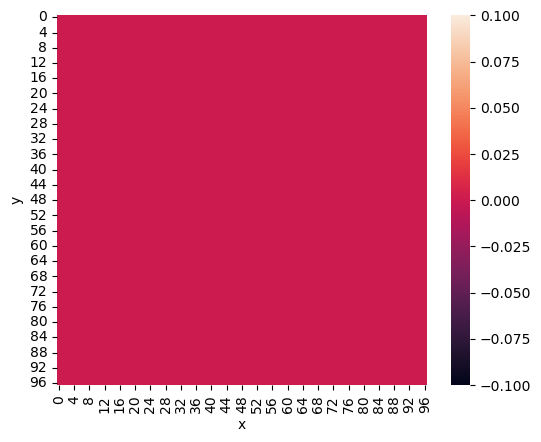

       x   y    J  err
0      0   0  0.0  0.0
1      0   1  0.0  0.0
2      0   2  0.0  0.0
3      0   3  0.0  0.0
4      0   4  0.0  0.0
...   ..  ..  ...  ...
9404  96  92 -0.0  0.0
9405  96  93  0.0  0.0
9406  96  94  0.0  0.0
9407  96  95  0.0  0.0
9408  96  96 -0.0  0.0

[9409 rows x 4 columns]


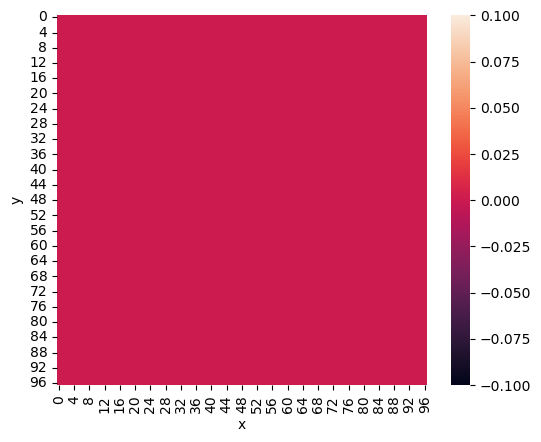

       x   y         J       err
0      0   0 -0.510977  0.000322
1      0   1 -0.498319  0.000268
2      0   2 -0.489789  0.000259
3      0   3 -0.480936  0.000287
4      0   4 -0.472941  0.000217
...   ..  ..       ...       ...
9404  96  92 -0.473055  0.000248
9405  96  93 -0.481522  0.000291
9406  96  94 -0.489797  0.000255
9407  96  95 -0.497459  0.000229
9408  96  96 -0.510805  0.000292

[9409 rows x 4 columns]


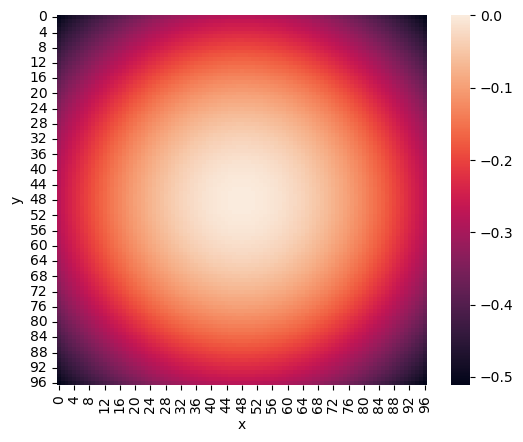

       x   y         J       err
0      0   0 -0.450198  0.000221
1      0   1 -0.438063  0.000245
2      0   2 -0.429963  0.000203
3      0   3 -0.422592  0.000211
4      0   4 -0.415121  0.000190
...   ..  ..       ...       ...
9404  96  92 -0.415091  0.000176
9405  96  93 -0.422822  0.000201
9406  96  94 -0.429895  0.000200
9407  96  95 -0.437906  0.000294
9408  96  96 -0.450418  0.000237

[9409 rows x 4 columns]


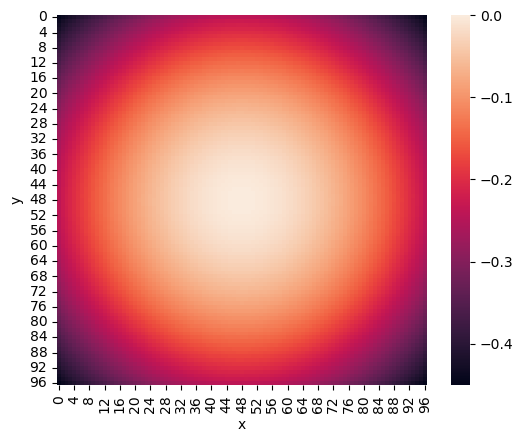

       x   y         J       err
0      0   0 -0.352981  0.000148
1      0   1 -0.342488  0.000166
2      0   2 -0.336032  0.000179
3      0   3 -0.330232  0.000174
4      0   4 -0.324097  0.000162
...   ..  ..       ...       ...
9404  96  92 -0.323976  0.000122
9405  96  93 -0.329830  0.000134
9406  96  94 -0.336220  0.000151
9407  96  95 -0.342298  0.000147
9408  96  96 -0.353123  0.000128

[9409 rows x 4 columns]


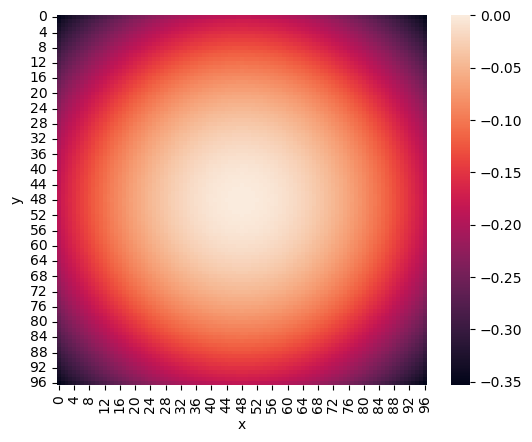

       x   y    J  err
0      0   0  0.0  0.0
1      0   1 -0.0  0.0
2      0   2 -0.0  0.0
3      0   3 -0.0  0.0
4      0   4  0.0  0.0
...   ..  ..  ...  ...
9404  96  92 -0.0  0.0
9405  96  93  0.0  0.0
9406  96  94 -0.0  0.0
9407  96  95  0.0  0.0
9408  96  96  0.0  0.0

[9409 rows x 4 columns]


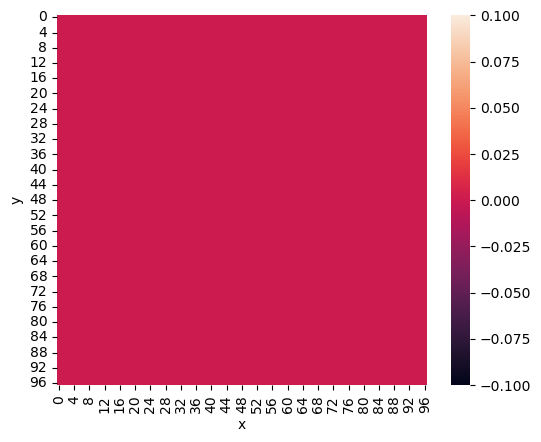

       x   y    J  err
0      0   0 -0.0  0.0
1      0   1 -0.0  0.0
2      0   2 -0.0  0.0
3      0   3  0.0  0.0
4      0   4 -0.0  0.0
...   ..  ..  ...  ...
9404  96  92  0.0  0.0
9405  96  93 -0.0  0.0
9406  96  94  0.0  0.0
9407  96  95  0.0  0.0
9408  96  96 -0.0  0.0

[9409 rows x 4 columns]


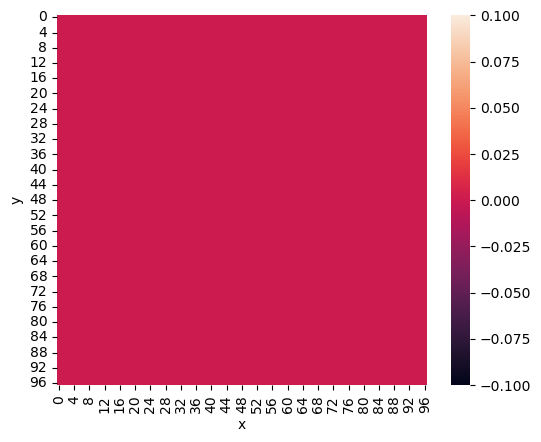

       x   y    J  err
0      0   0  0.0  0.0
1      0   1 -0.0  0.0
2      0   2 -0.0  0.0
3      0   3  0.0  0.0
4      0   4 -0.0  0.0
...   ..  ..  ...  ...
9404  96  92  0.0  0.0
9405  96  93 -0.0  0.0
9406  96  94  0.0  0.0
9407  96  95  0.0  0.0
9408  96  96 -0.0  0.0

[9409 rows x 4 columns]


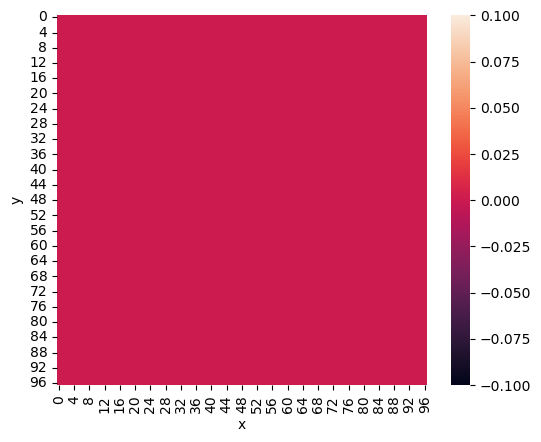

       x   y         J       err
0      0   0 -0.511157  0.000306
1      0   1 -0.498279  0.000320
2      0   2 -0.490237  0.000204
3      0   3 -0.481657  0.000192
4      0   4 -0.473356  0.000284
...   ..  ..       ...       ...
9404  96  92 -0.472811  0.000345
9405  96  93 -0.481227  0.000207
9406  96  94 -0.489596  0.000267
9407  96  95 -0.498264  0.000274
9408  96  96 -0.511231  0.000311

[9409 rows x 4 columns]


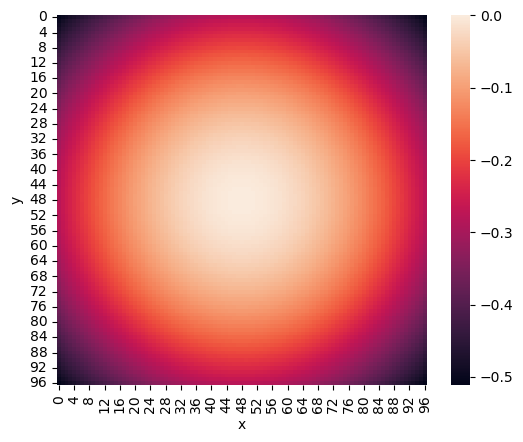

       x   y         J       err
0      0   0 -0.451178  0.000201
1      0   1 -0.439029  0.000220
2      0   2 -0.430830  0.000271
3      0   3 -0.423293  0.000226
4      0   4 -0.415877  0.000191
...   ..  ..       ...       ...
9404  96  92 -0.415444  0.000214
9405  96  93 -0.422844  0.000201
9406  96  94 -0.430312  0.000122
9407  96  95 -0.438541  0.000180
9408  96  96 -0.451244  0.000213

[9409 rows x 4 columns]


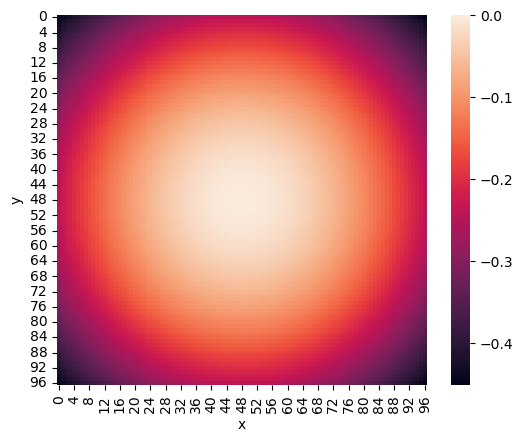

       x   y         J       err
0      0   0 -0.352595  0.000136
1      0   1 -0.341823  0.000147
2      0   2 -0.335924  0.000138
3      0   3 -0.329647  0.000121
4      0   4 -0.323284  0.000145
...   ..  ..       ...       ...
9404  96  92 -0.323211  0.000161
9405  96  93 -0.329306  0.000174
9406  96  94 -0.335468  0.000216
9407  96  95 -0.341802  0.000155
9408  96  96 -0.352822  0.000149

[9409 rows x 4 columns]


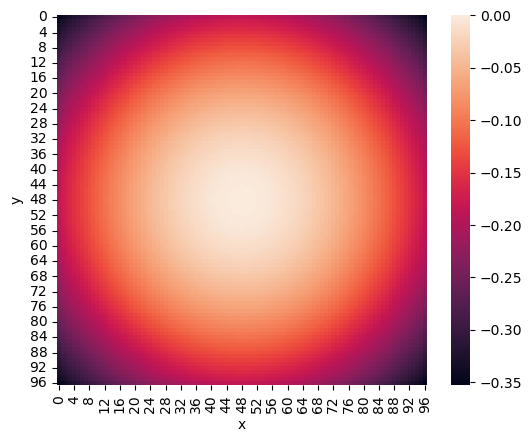

In [18]:
make_heatmap('../../result/eos_rotation_imaginary/4x24x97sq/PBC_cV/0.000000v/xy_Jv_3.7200.txt')
make_heatmap('../../result/eos_rotation_imaginary/4x24x97sq/PBC_cV/0.000000v/xy_Jv_4.0000.txt')
make_heatmap('../../result/eos_rotation_imaginary/4x24x97sq/PBC_cV/0.000000v/xy_Jv_4.8400.txt')
make_heatmap('../../result/eos_rotation_imaginary/4x24x97sq/PBC_cV/0.400000v/xy_Jv_3.7200.txt')
make_heatmap('../../result/eos_rotation_imaginary/4x24x97sq/PBC_cV/0.400000v/xy_Jv_4.0000.txt')
make_heatmap('../../result/eos_rotation_imaginary/4x24x97sq/PBC_cV/0.400000v/xy_Jv_4.8400.txt')
make_heatmap('../../result/eos_rotation_imaginary/24x24x97sq/PBC_cV/0.000000v/xy_Jv_3.7200.txt')
make_heatmap('../../result/eos_rotation_imaginary/24x24x97sq/PBC_cV/0.000000v/xy_Jv_4.0000.txt')
make_heatmap('../../result/eos_rotation_imaginary/24x24x97sq/PBC_cV/0.000000v/xy_Jv_4.8400.txt')
make_heatmap('../../result/eos_rotation_imaginary/24x24x97sq/PBC_cV/0.400000v/xy_Jv_3.7200.txt')
make_heatmap('../../result/eos_rotation_imaginary/24x24x97sq/PBC_cV/0.400000v/xy_Jv_4.0000.txt')
make_heatmap('../../result/eos_rotation_imaginary/24x24x97sq/PBC_cV/0.400000v/xy_Jv_4.8400.txt')